In [2]:
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset
import torch.nn as nn
import math
import numpy as np
from tqdm import tqdm
from pyhdf.SD import SD, SDC
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import stats

from os.path import join as path_join
from neuralop import LpLoss
from scipy.ndimage import zoom
import os
from neuralop.losses import H1Loss
from scipy.interpolate import RegularGridInterpolator
import gc

FILE_NAMES = ["vr002.hdf", "br002.hdf", "vt002.hdf", "vp002.hdf", "bt002.hdf", "bp002.hdf", "jt002.hdf", "jp002.hdf", "jr002.hdf", "rho002.hdf", "p002.hdf"]
# FILE_NAMES = ["vr002.hdf", "br002.hdf", "vt002.hdf", "vp002.hdf", "bt002.hdf", "bp002.hdf"]
DEFAULT_RESOLUTIONS = ['medium', 'high']
BASE_DIR =  '/data/solar_wind_pred_vignesh/ParamNetwork_Paper'
component_list = ["vt", "vp", "bt", "bp", "jt", "jp", "jr", "rho", "p"]
PER_SAMPLE_PER_COMPONENT_METRICS = ['MSE','PSNR','UQI', 'NNSE', 'EMV', 'ACC']
import pandas as pd
import seaborn as sns

In [9]:
DEFAULT_INSTRUMENTS = [
    "kpo_mas_mas_std_0101",
    "mdi_mas_mas_std_0101",
    "hmi_mast_mas_std_0101",
    "hmi_mast_mas_std_0201",
    "hmi_masp_mas_std_0201",
    "mdi_mas_mas_std_0201",
]


def read_hdf(hdf_path, dataset_names):
    f = SD(hdf_path, SDC.READ)
    datasets = []
    for dataset_name in dataset_names:
        datasets.append(f.select(dataset_name).get())
    return datasets


def get_coords(sim_path):
    v_path = path_join(sim_path, FILE_NAMES[0])
    thetas, phis = read_hdf(v_path, ["fakeDim1", "fakeDim0"])
    return thetas, phis

def interpolate_cube(data, x_old, y_old, z_old, x_new, y_new, z_new):
    interp_func = RegularGridInterpolator(
        (x_old, y_old, z_old),
        data,
        method="linear",
        bounds_error=False,
        fill_value=None,
    )
    xg, yg, zg = np.meshgrid(x_new, y_new, z_new, indexing="ij")
    points_new = np.stack([xg.ravel(), yg.ravel(), zg.ravel()], axis=-1)
    data_new_flat = interp_func(points_new)
    data_new = data_new_flat.reshape((len(x_new), len(y_new), len(z_new)))
    return data_new

def read_sim(sim_path):
    dataset_names = ["Data-Set-2", "fakeDim0", "fakeDim1", "fakeDim2"]
    component_dict = {k.split('002')[0]:{} for k in FILE_NAMES}
    target_phi, target_theta, target_r = [None]*3
    for file_name in FILE_NAMES:
        data, phi, theta, r = read_hdf(f"{sim_path}/{file_name}", dataset_names) 
        comp = file_name.split('002')[0]
        component_dict[comp] = {
            'data': data[:,:, :3],
            'theta': theta,
            'r': r[:3],
            'phi': phi,
        }
        if comp == 'vp':
            target_r = np.array([r[1]], dtype=r.dtype) # [30.742662]
            target_theta = theta
            target_phi = phi
            
    return (component_dict, target_r, target_theta, target_phi)

def read_medium_target_grid(medium_ref_path="/data/solar_wind_pred_vignesh/hdf/medium/cr1625/kpo_mas_mas_std_0101"):
    _, target_r, target_theta, target_phi = read_sim(medium_ref_path)

    return target_r, target_theta, target_phi

def read_high_target_grid(medium_ref_path="/data/solar_wind_pred_vignesh/hdf/high/cr2235/hmi_masp_mas_std_0201"):
    _, target_r, target_theta, target_phi = read_sim(medium_ref_path)

    return target_r, target_theta, target_phi
    
def get_sim(sim_path, scale_up):
    
    component_list = [k.split('002')[0] for k in FILE_NAMES]
    out,_,_,_= read_sim(sim_path)
    target_r, target_theta, target_phi = read_medium_target_grid()
    final = dict()
    for component in component_list:
        
        data_old, theta_old, r_old, phi_old = (
            out[component]["data"],
            out[component]["theta"],
            out[component]["r"],
            out[component]["phi"],
        )
        # print(f'{component}: Before Interpolation shape: {data_old.shape}')
        data_new = interpolate_cube(data_old, phi_old, theta_old, r_old, target_phi, target_theta, target_r)
        data_new = np.transpose(data_new, (2, 1, 0))  # (r, theta, phi)
        # print(f'{component}: After Interpolation shape: {data_new.shape}')
        final[component] = data_new[0,1:-1,:]
        # print(f'{component}: After Cropping shape: {final[component].shape}')

    final_component_arr = np.array([final[comp] for comp in component_list])
    
    if scale_up != 1:
        final_component_arr = enlarge_cube(final_component_arr, scale_up)

    return final_component_arr, (target_r, target_theta[1:-1], target_phi)


def get_sims(sim_paths, scale_up, pos_emb = None):
    sims = []

    for sim_path in tqdm(sim_paths, desc="Loading simulations"):
        sim, _ = get_sim(sim_path, scale_up)  # (140, 111, 128)
        sims.append(sim)

    sims = np.stack(sims, axis=0)  # (N, 11, 111, 128)
    return sims



def enlarge_cube(cube, scale):
    """
    Enlarge the spatial dimensions (axis 2 and 3) of a 4D cube using bilinear interpolation.

    Parameters:
    - cube: np.ndarray of shape (11, 110, 128)
    - scale: int or float (e.g., 2)

    Returns:
    - enlarged_cube: np.ndarray of shape (11, 110 * scale, 128 * scale)
    """
    return zoom(cube, (1, scale, scale), order=1)

def signed_sqrt_transform(array):
    return np.sign(array) * (np.abs(array)**0.5)

def signed_pow_transform(array, power):
    return np.sign(array) * (np.abs(array)**power)

def signed_log_transform(array):
    return np.sign(array) * np.log(np.abs(array)+1)

def signed_transform(array, transform='sqrt', power=None):
    if transform == 'sqrt':
        return signed_sqrt_transform(array)
    elif transform == 'log':
        return signed_log_transform(array)
    elif transform == 'pow' and power is not None:
        return signed_pow_transform(array, power)
    else:
        raise ValueError("Unsupported transform type or missing power for 'pow' transform.")

def data_transformation(array, transform='sqrt', power=None):
    """
    :param array: (11, H, W)
    Returns: array after data transformation 
    """
    # VR_0 -> No transformation required
    
    # BR_0 -> No transformation required
    # VT_0
    array[:,2] = signed_transform(array[:,2], transform=transform, power=power)   # Sign-preserving data transformation
    # VP_0
    array[:,3] = signed_transform(array[:,3], transform=transform, power=power)   # Sign-preserving data transformation
    # BT_0
    array[:,4] = signed_transform(array[:,4], transform=transform, power=power)   # Sign-preserving data transformation
    # BP_0
    array[:,5] = signed_transform(array[:,5], transform=transform, power=power)   # Sign-preserving data transformation
    # JT_0 -> No transformation required
    # JP_0
    array[:,7] = signed_transform(array[:,7], transform=transform, power=power)   # Sign-preserving data transformation
    # JR_0
    array[:,8] = signed_transform(array[:,8], transform=transform, power=power)   # Sign-preserving data transformation
    # RHO_0 -> No transformation required
    array[:,9] = signed_sqrt_transform(array[:,9])   # Sign-preserving square root transformation
    # P_0 
    array[:,10] = signed_transform(array[:,10], transform='pow', power=0.25)   # Sign-preserving POW(0.25) transformation
    return array


def signed_power_inverse_transform(array, power):
    return torch.sign(array) * (torch.abs(array)**power)

def signed_exp_inverse_transform(array):
    return torch.sign(array) * (torch.exp(torch.abs(array)) - 1)

def signed_inverse_transform(array, transform='square', power=None):
    if transform == 'square':
        return signed_power_inverse_transform(array, power=2)
    elif transform == 'exp':
        return signed_exp_inverse_transform(array)  # Subtract 1 to reverse the +1 in the log transform
    elif transform == 'pow' and power is not None:
        return signed_power_inverse_transform(array, power=power)
    else:
        raise ValueError("Unsupported inverse transform type or missing power for 'pow' inverse transform.")

def data_inverse_transformation(array,inverse_transform, power=None, scale_metric=481.3711):
    """
    :param array: (9, H, W)  
    Returns: array after data transformation 
    """
    # VR_0 -> No inverse transformation required
    
    # BR_0 -> No inverse transformation required
    # VT_0
    array[:, 0] = signed_inverse_transform(array[:, 0], transform=inverse_transform, power=power)   # Sign-preserving inverse transformation
    # VP_0
    array[:,1] = signed_inverse_transform(array[:, 1], transform=inverse_transform, power=power)   # Sign-preserving inverse transformation
    # BT_0
    array[:, 2] = signed_inverse_transform(array[:, 2], transform=inverse_transform, power=power)   # Sign-preserving inverse transformation
    # BP_0
    array[:, 3] = signed_inverse_transform(array[:, 3], transform=inverse_transform, power=power)   # Sign-preserving inverse transformation
    # JT_0 -> No inverse transformation required
    # JP_0
    array[:, 5] = signed_inverse_transform(array[:, 5], transform=inverse_transform, power=power)   # Sign-preserving inverse transformation
    # JR_0
    array[:, 6] = signed_inverse_transform(array[:, 6], transform=inverse_transform, power=power)   # Sign-preserving inverse transformation
    # RHO_0 -> No inverse transformation required
    array[:, 7] = signed_inverse_transform(array[:, 7], transform='square')   # Sign-preserving inverse square transformation
    # P_0 
    array[:, 8] = signed_inverse_transform(array[:, 8], transform='pow', power=4)   # Sign-preserving inverse POW(4) transformation

    return array * scale_metric

def min_max_normalize(array, min_=None, max_=None):
    if min_ is None or max_ is None:
        min_ = np.min(array, axis=(0,2,3))
        max_ = np.max(array, axis=(0,2,3))
    array = (array - min_[:,None, None]) / (max_[:,None, None] - min_[:,None, None] + 1e-9)
    return array, min_, max_

def min_max_denormalize(array, min_, max_):
    '''
    Denormalize the data using the provided min and max values.
    :param array: Normalized array of shape (N, 11, H, W)
    :param min_: Minimum values for each channel (shape: (11,))
    :param max_: Maximum values for each channel (shape: (11,))
    '''
    array = array * (max_[:, None, None] - min_[:, None, None] + 1e-9) + min_[:, None, None]
    return array

def compute_climatology(data: np.ndarray, scale_up) -> np.ndarray:
    """
    Compute per-voxel climatology (mean field) from a dataset.

    Args:
        data (np.ndarray): Array of shape (N, 9, 109, 128)

    Returns:
        np.ndarray: Climatology array of shape (9, 109, 128)
    """
    # assert data.ndim == 4 and data.shape[1:] == (
    #     9,
    #     109 * scale_up,
    #     128 * scale_up,
    # ), "Unexpected input shape."
    climatology = np.mean(data, axis=0)
    climatology = torch.tensor(climatology, dtype=torch.float32)
    return climatology


def get_cr_dirs(data_path):
    """Return list of CR directories (crXXXX) inside data_path."""
    resolution_list = ['medium', 'high']
    cr_dirs = sorted(
        [
            d
            for d in os.listdir(data_path)
            if d.startswith("cr") and os.path.isdir(os.path.join(data_path, d))
        ]
    )
    return cr_dirs



def collect_sim_paths(data_path, cr_list, instruments=None, resolutions = None):
    """Collect simulation paths given a list of CR directories."""
    if instruments is None:
        instruments = DEFAULT_INSTRUMENTS
    resolutions = DEFAULT_RESOLUTIONS if resolutions is None else resolutions

    sim_paths = []
    cr_nums = []
    for res in resolutions:
        for cr in cr_list:
            cr_path = os.path.join(data_path, res, cr)
            for instrument in instruments:
                instrument_path = os.path.join(cr_path, instrument)
                if os.path.exists(instrument_path):
                    sim_paths.append(instrument_path)
                    cr_nums.append(cr)
    return sim_paths, cr_nums


class InitialParamDataset(Dataset):
    def __init__(
        self,
        data_path,
        cr_list,
        v_min=None,
        v_max=None,
        instruments=None,
        scale_up=1,
        pos_embedding = None,
        transform=None,
        transform_fn = None,
        resolutions = None
    ):
        super().__init__()
        if transform == 'pow':
            self.transform = 'pow'
            self.inverse_transform = 'pow'
            self.transform_power = 0.5
            self.inverse_transform_power = 2
        elif transform in {'sqrt', 'log'}:
            self.transform = transform
            self.inverse_transform = 'exp' if transform == 'log' else 'square'
            self.transform_power = None
            self.inverse_transform_power = None
        
        self.sim_paths, self.cr_mapping = collect_sim_paths(data_path, cr_list, instruments, resolutions)
        # print(self.sim_paths)
        self.sims = get_sims(self.sim_paths, scale_up, pos_embedding)
        self.climatology = compute_climatology(self.sims[:,2:], scale_up)
        print(self.sims.shape)

        _, (r,theta,phi) = get_sim(self.sim_paths[0], scale_up)
        self.r = torch.tensor(r, dtype=torch.float32)
        self.theta = torch.tensor(theta, dtype=torch.float32)
        self.phi = torch.tensor(phi, dtype=torch.float32)
        # self.sims = data_transformation(self.sims, self.transform, power=self.transform_power)
        # self.sims, self.v_min, self.v_max = min_max_normalize(self.sims, v_min, v_max)

        self.data_min = torch.tensor([ 4.67303783e-01, -1.58353511e-03, -7.15157911e-02, -3.33132781e-02,
       -1.28728367e-04, -2.80083535e-04, -4.16646682e-04, -1.07131642e-03,
       -1.45251848e-04,  1.45591866e-06,  1.14962724e-07], dtype=torch.float32)
        self.data_max = torch.tensor([1.3710672e+00, 1.6776990e-03, 7.1827546e-02, 6.5376662e-02,
       8.6796281e-05, 2.7548801e-04, 3.7248712e-04, 1.0954458e-03,
       1.5482063e-04, 1.2102652e-05, 4.1580401e-07], dtype=torch.float32)

        

    def __getitem__(self, index):
        cube = self.sims[index]

        C, H, W = cube.shape

        return {
            "x": torch.from_numpy(cube[:2]).float(),
            "y": torch.from_numpy(cube[2:]).float(),
            'cr': self.cr_mapping[index],
            'idx': index
        }

    def __len__(self):
        return len(self.sims)

    # def get_min_max(self):
        # return {"v_min": [float(v) for v in self.v_min], "v_max": [float(v) for v in self.v_max]}

    def get_grid_points(self):
        return get_coords(self.sim_paths[0])


In [10]:
crs_mix = get_cr_dirs_res("/data/solar_wind_pred_vignesh/hdf/")

NameError: name 'get_cr_dirs_res' is not defined

In [109]:
def get_cr_dirs_res(data_path):
    """Return list of CR directories (crXXXX) inside data_path."""
    resolution_list = ['medium', 'high']
    cr_dirs = sorted(
        [
            d
            for res in resolution_list 
            for d in os.listdir(os.path.join(data_path, res))
            if d.startswith("cr") and os.path.isdir(os.path.join(data_path,res, d))
        ]
    )
    return cr_dirs

In [66]:
len(crs_mix)
test_crs = crs_mix[:10]+crs_mix[-10:]

In [12]:
crs_medium = get_cr_dirs("/data/solar_wind_pred_vignesh/hdf/medium")
len(crs_medium)

562

In [13]:
med_data = InitialParamDataset("/data/solar_wind_pred_vignesh/hdf/", crs_medium, resolutions=['medium'], transform='sqrt') 

Loading simulations: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 907/907 [03:01<00:00,  4.99it/s]


(907, 11, 109, 128)


In [73]:
len(data)

40

In [58]:
medium_data = read_sim('/data/solar_wind_pred_vignesh/hdf/medium/cr1625/kpo_mas_mas_std_0101')
high_data = read_sim('/data/solar_wind_pred_vignesh/hdf/high/cr2235/hmi_masp_mas_std_0201')

In [74]:
high_data[0]['vr']['data'].shape

(361, 157, 3)

In [60]:
medium_data[0]['vr']['data'].shape

(128, 111, 3)

In [63]:
high_data[0]['vr']['theta'].shape

(157,)

In [79]:
data[-1]['x'].shape

torch.Size([2, 109, 128])

In [8]:
LABEL_CONFIG = {
    "vt": {"cmap": "viridis", "title": r"$v_\theta$"},
    "vp": {"cmap": "viridis", "title": r"$v_\phi$"},
    "bt": {"cmap": "viridis", "title": r"$\mathbf{B}_\theta$"},
    "bp": {"cmap": "viridis", "title": r"$\mathbf{B}_\phi$"},
    "jt": {"cmap": "viridis", "title": r"$\mathbf{J}_\theta$"},
    "jp": {"cmap": "viridis", "title": r"$\mathbf{J}_\phi$"},
    "jr": {"cmap": "viridis", "title": r"$\mathbf{J}_r$"},
    "rho": {"cmap": "viridis", "title": r"$\rho$"},
    "p": {"cmap": "viridis", "title": r"$p$"}
}
LABELS = ["vt", "vp", "bt", "bp", "jt", "jp", "jr", "rho", "p"]
def create_initial_param_plot(data_medium, data_high, labels, folder_path="./", file_name="resolution_interpolation_medium", cmap="viridis", dpi=200):
    
    y_med = data_medium['y']
    y_high = data_high['y']
    output_path = os.path.join(folder_path, file_name)
    n_components = y_med.shape[0]
    fig, ax = plt.subplots(n_components,2, figsize=(15, n_components*5))
    for i in range(n_components):
        vmin = np.min([y_med[i].min(), y_high[i].min()])
        vmax = np.max([y_med[i].max(), y_high[i].max()])

        im0 = ax[i, 0].imshow(y_med[i], cmap=f'{LABEL_CONFIG[labels[i]]["cmap"]}', vmin=vmin, vmax=vmax)
        ax[i, 0].set_ylabel(f'{LABEL_CONFIG[labels[i]]["title"]}', fontsize=28)

        im1 = ax[i,1].imshow(y_high[i], cmap=f'{LABEL_CONFIG[labels[i]]["cmap"]}', vmin=vmin, vmax=vmax)

        for row in range(2):
            ax[i, row].set_xticks([])
            ax[i, row].set_yticks([])

        if i == 0:
            ax[0, 0].set_title(f"Medium\n{data_medium['cr']}", fontsize=38)
            ax[0, 1].set_title(f"High\n{data_high['cr']}", fontsize=38)
        # colorbar for each image, same scale (vmin/vmax) within the row
        fig.colorbar(im0, ax=ax[i, 0], fraction=0.02, pad=0.04)
        fig.colorbar(im1, ax=ax[i, 1], fraction=0.02, pad=0.04)
    plt.tight_layout()
    plt.savefig(f'{output_path}.png', dpi=dpi)
    # plt.savefig(f'{output_path}.pdf', dpi=dpi)
    plt.show()
    plt.close(fig)

    print(f"Initial parameter comparison plot saved to {output_path}.png")

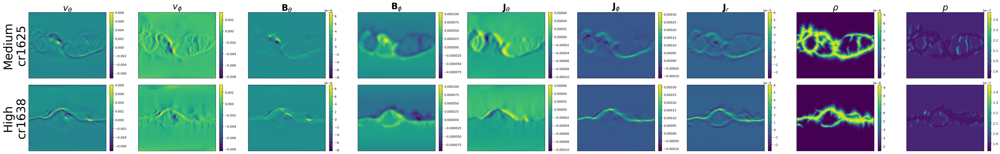

Initial parameter comparison plot saved to ./initial_param_comparison.png


In [101]:
create_initial_param_plot(med_data[0], med_data[-1], LABELS)

# Interpolation to Medium Resolution

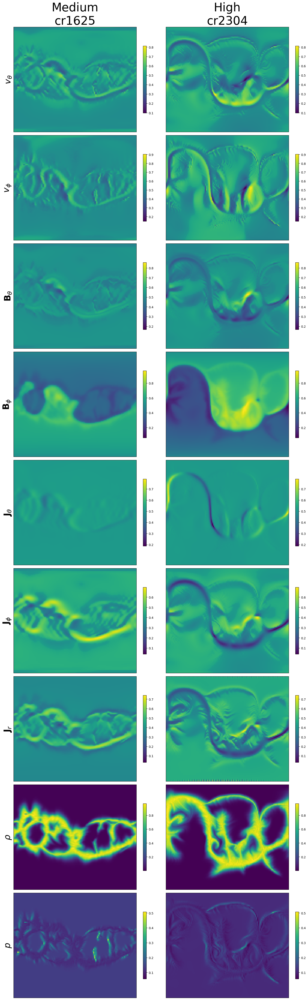

Initial parameter comparison plot saved to ./resolution_interpolation_medium.png


In [158]:
create_initial_param_plot(med_data[0], med_data[-1], LABELS)

# Interpolation to High Resolution

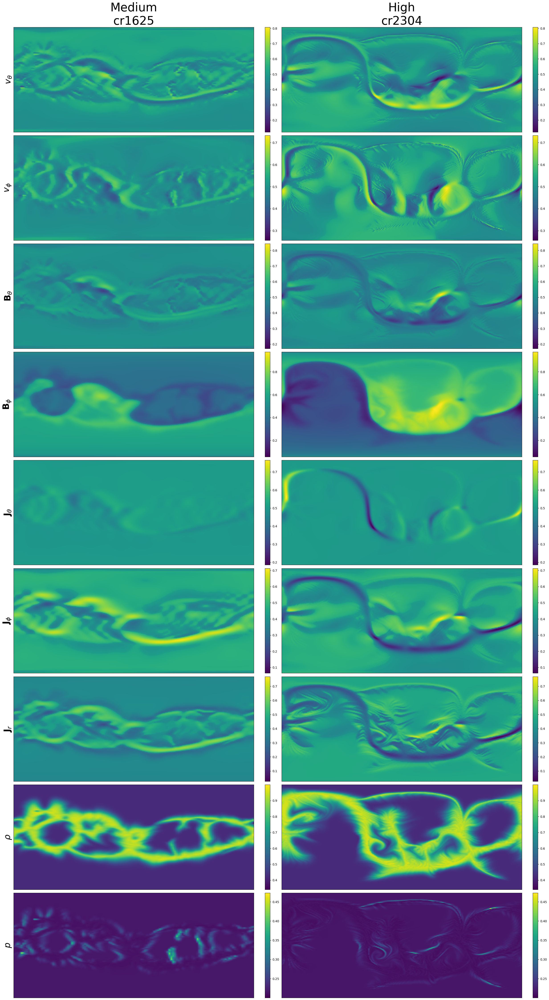

Initial parameter comparison plot saved to ./resolution_interpolation_high.png


In [152]:
create_initial_param_plot(data[0], data[-1], LABELS)

In [9]:
BASE_DIR =  '/data/solar_wind_pred_vignesh/ParamNetwork_Paper'
component_list = ["vt", "vp", "bt", "bp", "jt", "jp", "jr", "rho", "p"]
PER_SAMPLE_PER_COMPONENT_METRICS = ['MSE','PSNR','UQI', 'NNSE', 'EMV', 'ACC']
import pandas as pd
import seaborn as sns

In [160]:
job_id_descriptors = {
    '2026_04_01__065102': {'rank': 0.4, 'resolution': 'medium'},
    '2026_05_11__040647': {'rank': 0.4, 'resolution': 'medium+high'},
}
for job in job_id_descriptors.keys():
    if job_id_descriptors[job]['resolution'] == 'medium':
        f = np.load(os.path.join(BASE_DIR, job,'test_best_epoch_per_sample_per_component.npz'))
    else:
        f = np.load(os.path.join('/data/solar_wind_pred_vignesh/ParamNetwork', job,'test_best_epoch_per_sample_per_component.npz'))
    for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
        job_id_descriptors[job][metric] = f[metric]

result_rows = []

for run_name, run_data in job_id_descriptors.items():
    for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
        metric_values = run_data[metric]
        row_dict = {}
        for idx, val in enumerate(metric_values):
            row_dict['rank'] = run_data["rank"]
            row_dict['resolution'] = run_data["resolution"]
            row_dict['job'] = run_name
            row_dict['metric'] = metric
            row_dict = {component_list[comp]: v for comp, v in enumerate(val)}
            result_rows.append(row_dict)

result_version_df = pd.DataFrame(result_rows)
print(result_version_df.shape)
result_version_df.head(n=10)

(2046, 13)


,vt,vp,bt,bp,jt,jp,jr,rho,p,rank,resolution,job,metric
0,0.019451,0.020053,1.472986e-07,3.299634e-06,2.398170e-06,1.288869e-05,4.594086e-07,1.077429e-09,3.846071e-14,0.4,medium,2026_04_01__065102,MSE
1,0.004804,0.006773,2.156490e-08,3.309967e-07,6.084532e-07,1.067848e-06,1.105311e-07,9.308410e-11,9.185418e-15,0.4,medium,2026_04_01__065102,MSE
2,0.004443,0.005821,3.459292e-09,2.793712e-07,3.883334e-07,1.043463e-06,8.201101e-08,9.211686e-11,8.818506e-15,0.4,medium,2026_04_01__065102,MSE
3,0.003586,0.003263,7.698546e-10,2.233214e-07,2.765294e-07,5.507462e-07,6.339214e-08,6.227592e-11,2.049029e-14,0.4,medium,2026_04_01__065102,MSE
4,0.005682,0.007838,1.628140e-08,3.246172e-07,6.507017e-07,1.336708e-06,1.096759e-07,1.059029e-10,5.156347e-15,0.4,medium,2026_04_01__065102,MSE
5,0.012048,0.014413,5.707268e-08,7.910967e-07,9.989349e-07,1.964770e-06,2.766257e-07,1.146258e-10,9.465630e-15,0.4,medium,2026_04_01__065102,MSE
6,0.010769,0.025667,4.728639e-08,5.826968e-07,9.348417e-07,2.589795e-06,1.761391e-07,7.092077e-11,8.998316e-15,0.4,medium,2026_04_01__065102,MSE
7,0.011981,0.024556,8.485694e-08,3.226767e-06,2.198354e-05,3.546809e-06,7.349150e-07,7.746397e-10,2.574739e-14,0.4,medium,2026_04_01__065102,MSE
8,0.005224,0.013474,8.683616e-09,7.504712e-07,1.599993e-06,1.518008e-06,2.249925e-07,4.206306e-10,1.359136e-14,0.4,medium,2026_04_01__065102,MSE
9,0.004871,0.016291,4.201206e-09,7.948943e-07,2.103696e-06,1.137448e-06,2.131963e-07,4.561954e-10,1.823991e-14,0.4,medium,2026_04_01__065102,MSE


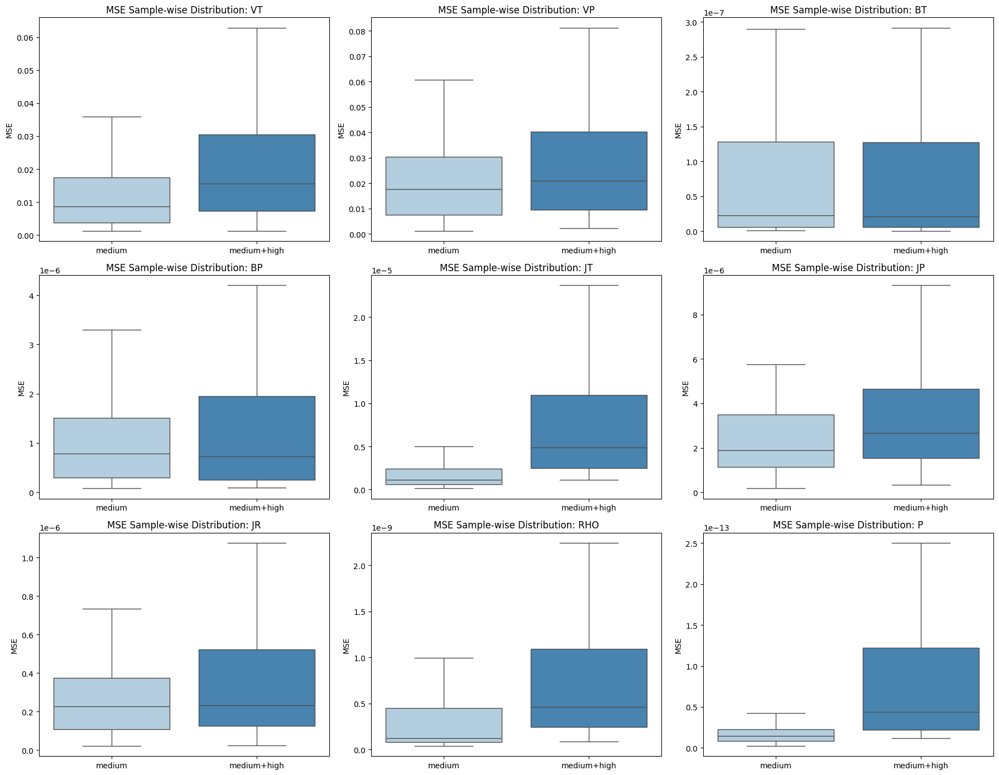

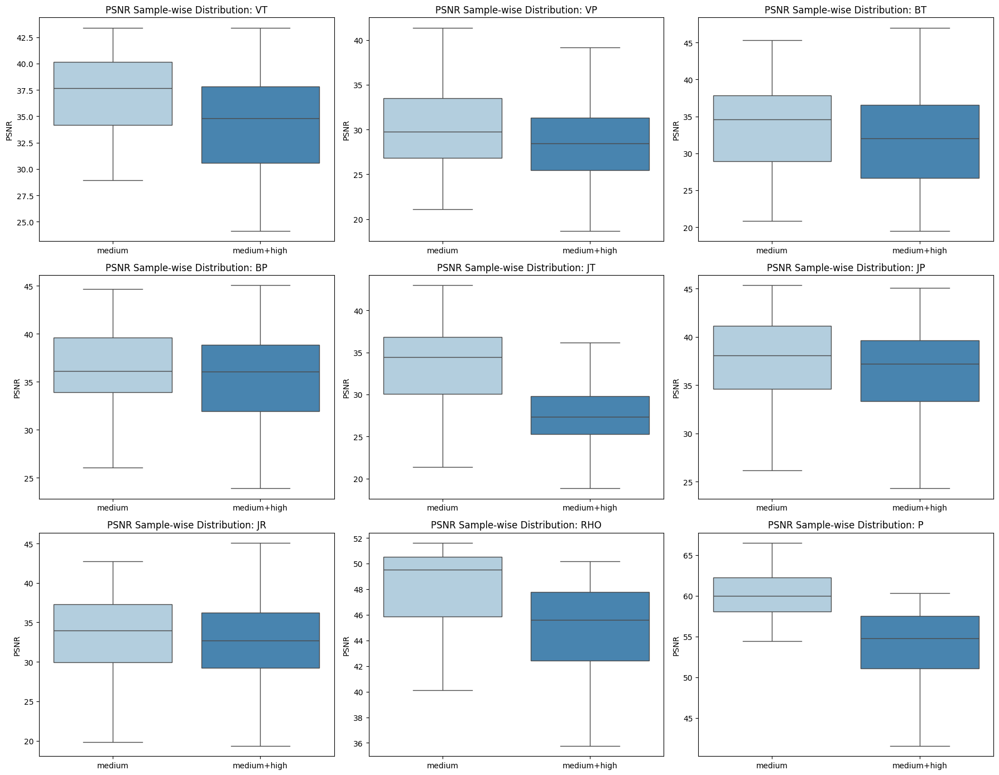

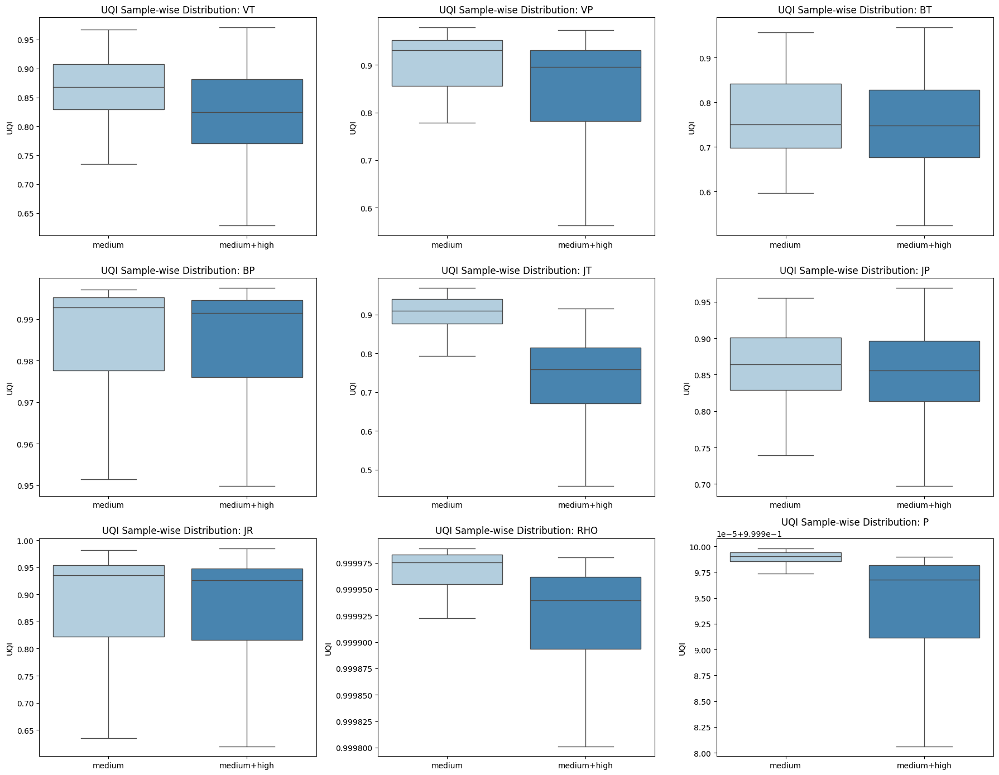

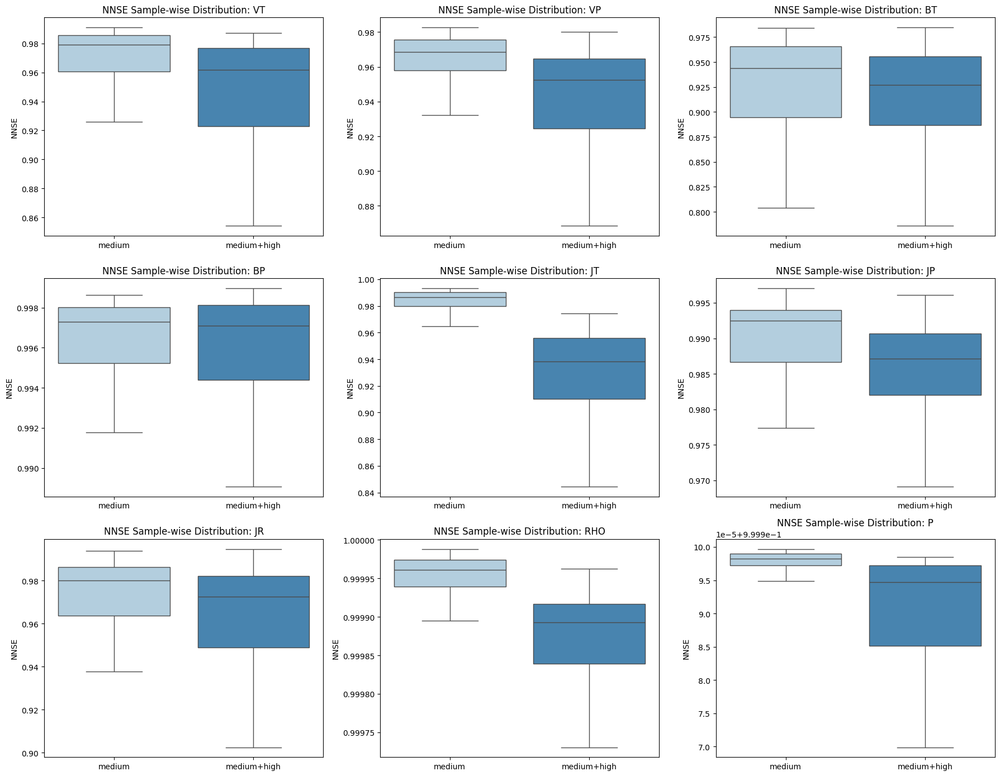

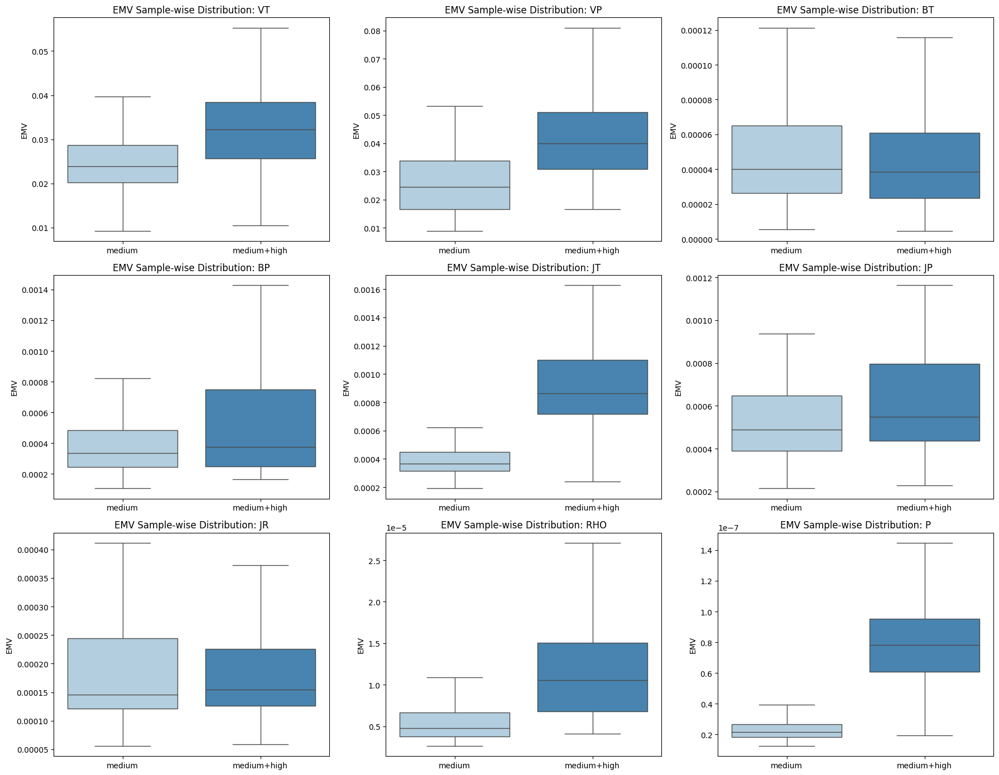

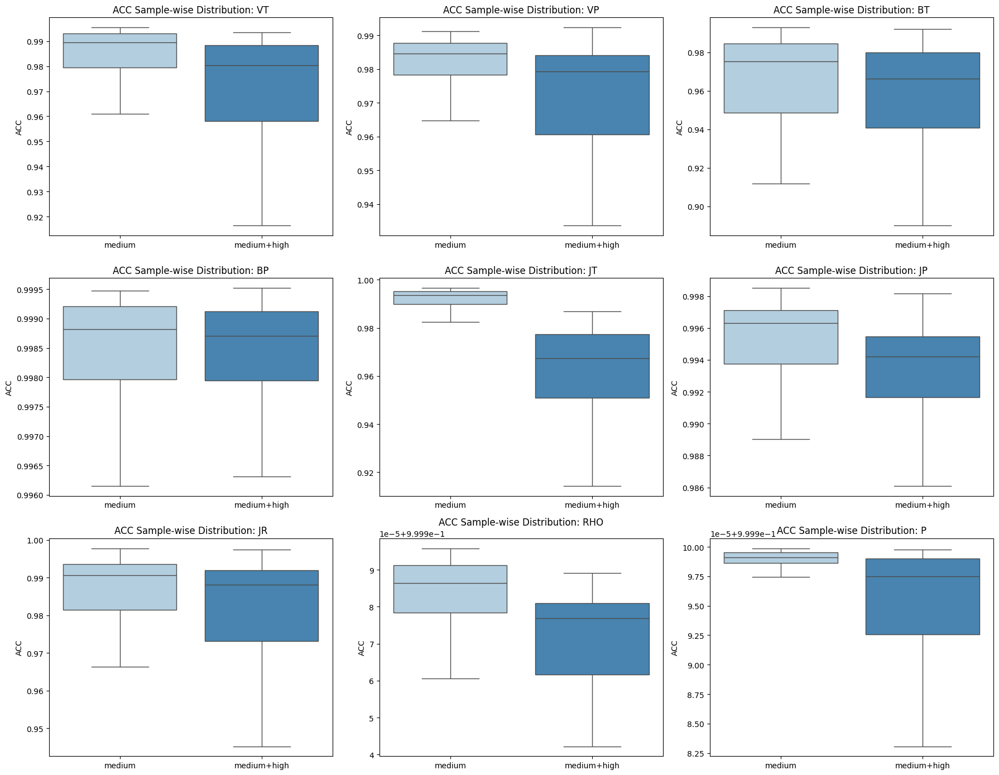

In [161]:
for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
    metric_df = result_version_df[result_version_df['metric'] == metric]
    
    fig, axes = plt.subplots(3, 3, figsize=(18, 14), sharey=False)
    axes = axes.flatten()
    
    for i, comp in enumerate(component_list):
        sns.boxplot(
            data=metric_df,
            x="resolution",              # distribution per run
            y=comp,               # PSNR values for this component
            hue="resolution",           # color by rank
            ax=axes[i],
            showfliers=False,
            palette="Blues",
            # legend=False
            # showfliers=True,
        )
        axes[i].set_title(f"{metric} Sample-wise Distribution: {comp.upper()}")
        axes[i].set_xlabel("")
        axes[i].set_ylabel(metric)
        axes[i].tick_params(axis="x", rotation=0)
        # axes[i].legend(title="Rank")
        # axes[i].legend_.remove()
    
    plt.tight_layout()
    # plt.savefig(os.path.join('data_transform_ablation', f'model_arch_distribution_{metric}.png'), dpi=200)
    plt.show()

# Gradnorm Learning rate Ablation

In [47]:
job_id_descriptors = {
    '2026_05_13__071503': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-3, 'alpha':1.5},
    '2026_05_18__020744': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5},
    # '2026_05_18__020818': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-3, 'alpha':2.5},
    # '2026_05_18__021130': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-3, 'alpha':1.0},
}
for job in job_id_descriptors.keys():
    if job_id_descriptors[job]['gradnorm'] == 'False':
        f = np.load(os.path.join(BASE_DIR, job,'test_best_epoch_per_sample_per_component.npz'))
    else:
        f = np.load(os.path.join('/data/solar_wind_pred_vignesh/ParamNetwork', job,'test_best_epoch_per_sample_per_component.npz'))
    for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
        job_id_descriptors[job][metric] = f[metric]

result_rows = []

for run_name, run_data in job_id_descriptors.items():
    for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
        metric_values = run_data[metric]
        row_dict = {}
        for idx, val in enumerate(metric_values):
            row_dict = {component_list[comp]: v for comp, v in enumerate(val)}
            for k, v in run_data.items():
                row_dict[k] = run_data[k]
            row_dict['job'] = run_name
            row_dict['metric'] = metric
            
            result_rows.append(row_dict)

result_lr_df = pd.DataFrame(result_rows)
print(result_lr_df.shape)
result_lr_df.head(n=5)

(2196, 21)


,vt,vp,bt,bp,jt,jp,jr,rho,p,rank,...,lr,alpha,MSE,PSNR,UQI,NNSE,EMV,ACC,job,metric
0,0.009751,0.011471,2.216914e-08,3.154420e-07,6.717854e-07,1.397320e-06,9.820107e-08,5.996129e-10,3.277421e-14,0.4,...,0.001,1.5,"[[0.009751376, 0.011471024, 2.2169145e-08, 3.1...","[[36.98704, 31.832735, 38.320045, 40.17495, 41...","[[0.8666704, 0.9154116, 0.73678607, 0.99252737...","[[0.9787936, 0.96956646, 0.9664407, 0.9981501,...","[[0.020175917, 0.024046429, 3.4866207e-05, 0.0...","[[0.9909067, 0.9842991, 0.98428357, 0.99916273...",2026_05_13__071503,MSE
1,0.010636,0.017948,4.065249e-08,4.030064e-07,8.980513e-07,2.020273e-06,1.292948e-07,7.123566e-10,2.469425e-14,0.4,...,0.001,1.5,"[[0.009751376, 0.011471024, 2.2169145e-08, 3.1...","[[36.98704, 31.832735, 38.320045, 40.17495, 41...","[[0.8666704, 0.9154116, 0.73678607, 0.99252737...","[[0.9787936, 0.96956646, 0.9664407, 0.9981501,...","[[0.020175917, 0.024046429, 3.4866207e-05, 0.0...","[[0.9909067, 0.9842991, 0.98428357, 0.99916273...",2026_05_13__071503,MSE
2,0.026197,0.030598,1.019825e-07,3.246657e-06,4.946240e-06,5.694979e-06,5.634263e-07,5.352023e-09,4.027332e-14,0.4,...,0.001,1.5,"[[0.009751376, 0.011471024, 2.2169145e-08, 3.1...","[[36.98704, 31.832735, 38.320045, 40.17495, 41...","[[0.8666704, 0.9154116, 0.73678607, 0.99252737...","[[0.9787936, 0.96956646, 0.9664407, 0.9981501,...","[[0.020175917, 0.024046429, 3.4866207e-05, 0.0...","[[0.9909067, 0.9842991, 0.98428357, 0.99916273...",2026_05_13__071503,MSE
3,0.008066,0.007665,2.715039e-08,2.418493e-07,6.703730e-07,9.864126e-07,6.470420e-08,1.926209e-10,1.850181e-14,0.4,...,0.001,1.5,"[[0.009751376, 0.011471024, 2.2169145e-08, 3.1...","[[36.98704, 31.832735, 38.320045, 40.17495, 41...","[[0.8666704, 0.9154116, 0.73678607, 0.99252737...","[[0.9787936, 0.96956646, 0.9664407, 0.9981501,...","[[0.020175917, 0.024046429, 3.4866207e-05, 0.0...","[[0.9909067, 0.9842991, 0.98428357, 0.99916273...",2026_05_13__071503,MSE
4,0.012663,0.011489,3.195812e-08,2.780591e-07,7.452197e-07,1.189460e-06,8.221392e-08,2.488511e-10,2.178343e-14,0.4,...,0.001,1.5,"[[0.009751376, 0.011471024, 2.2169145e-08, 3.1...","[[36.98704, 31.832735, 38.320045, 40.17495, 41...","[[0.8666704, 0.9154116, 0.73678607, 0.99252737...","[[0.9787936, 0.96956646, 0.9664407, 0.9981501,...","[[0.020175917, 0.024046429, 3.4866207e-05, 0.0...","[[0.9909067, 0.9842991, 0.98428357, 0.99916273...",2026_05_13__071503,MSE


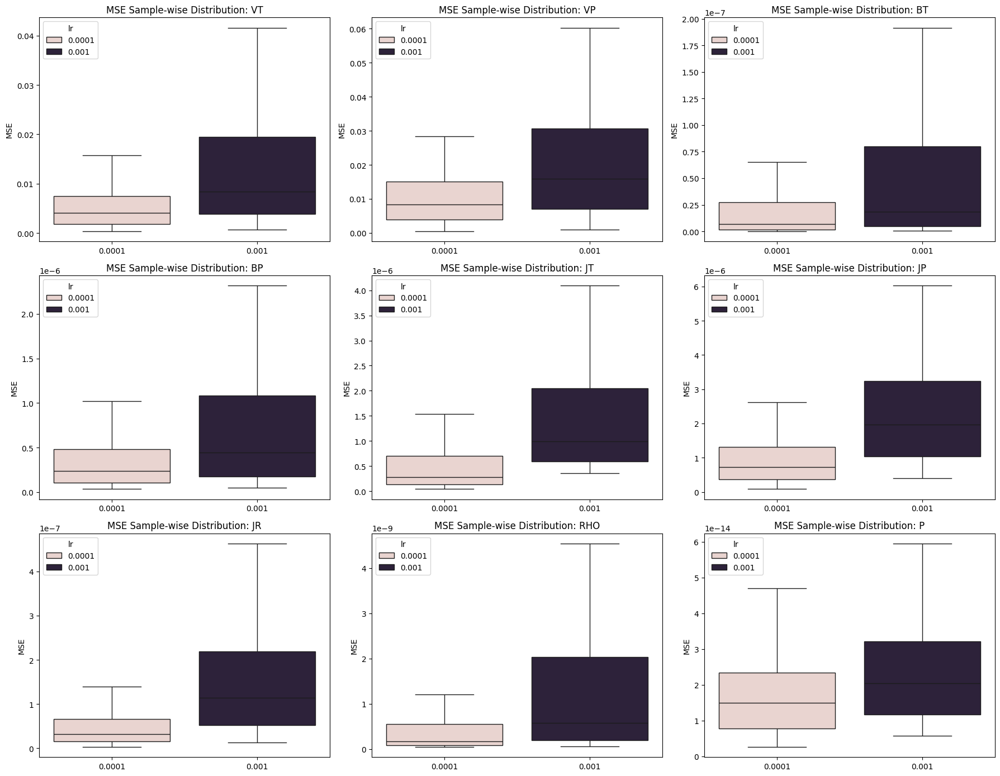

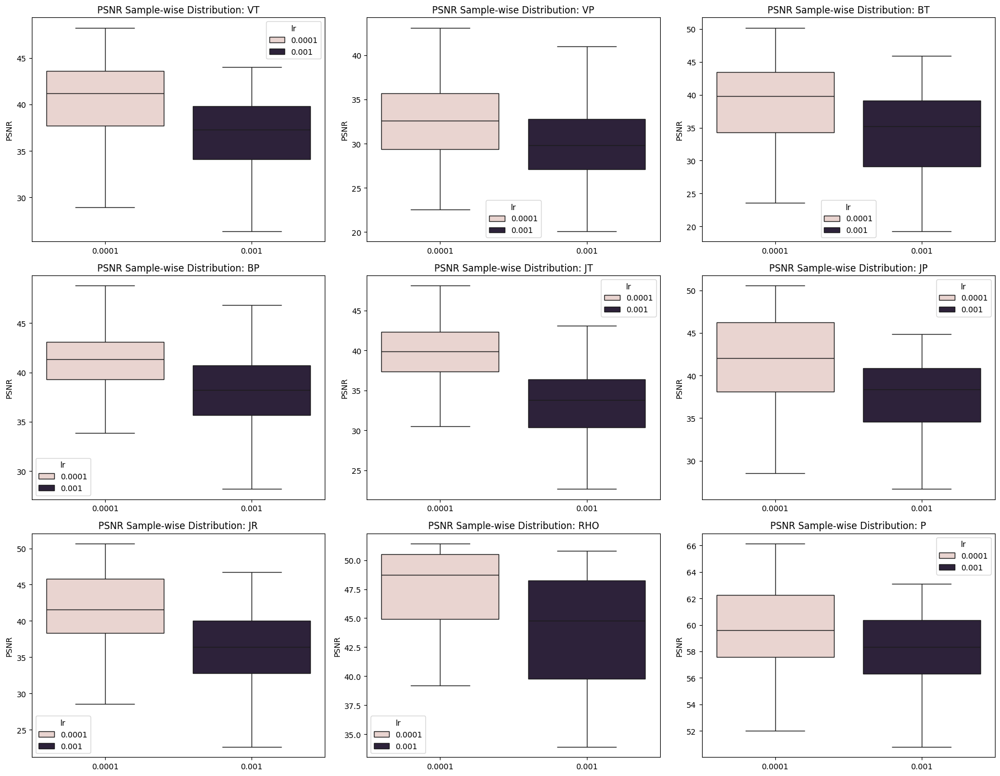

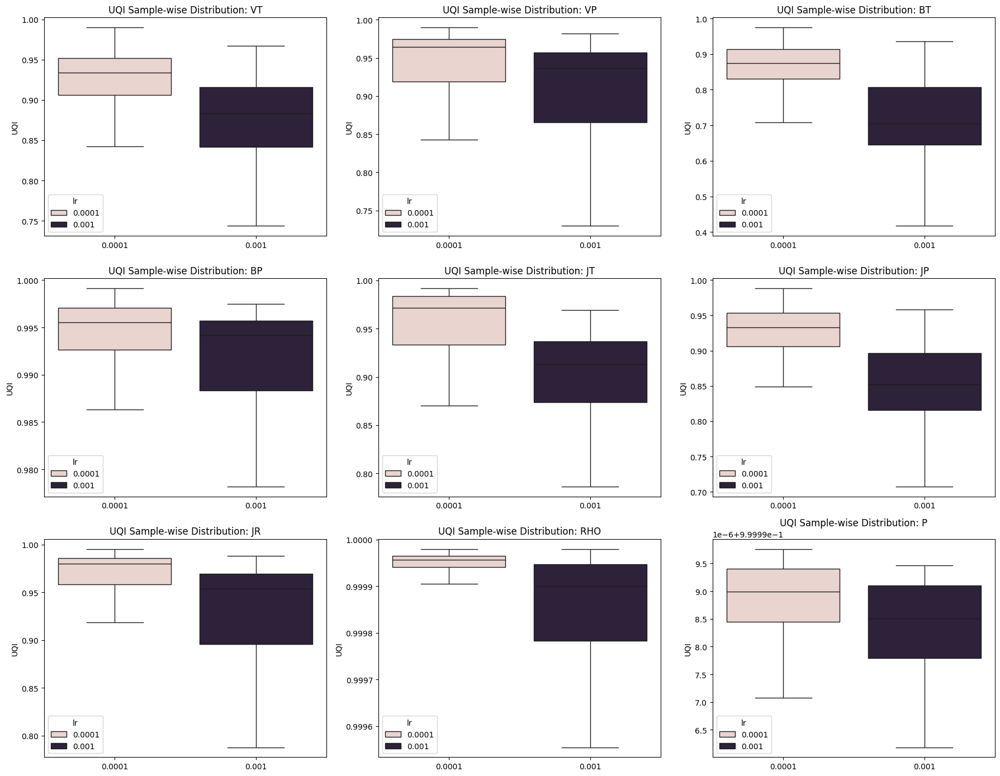

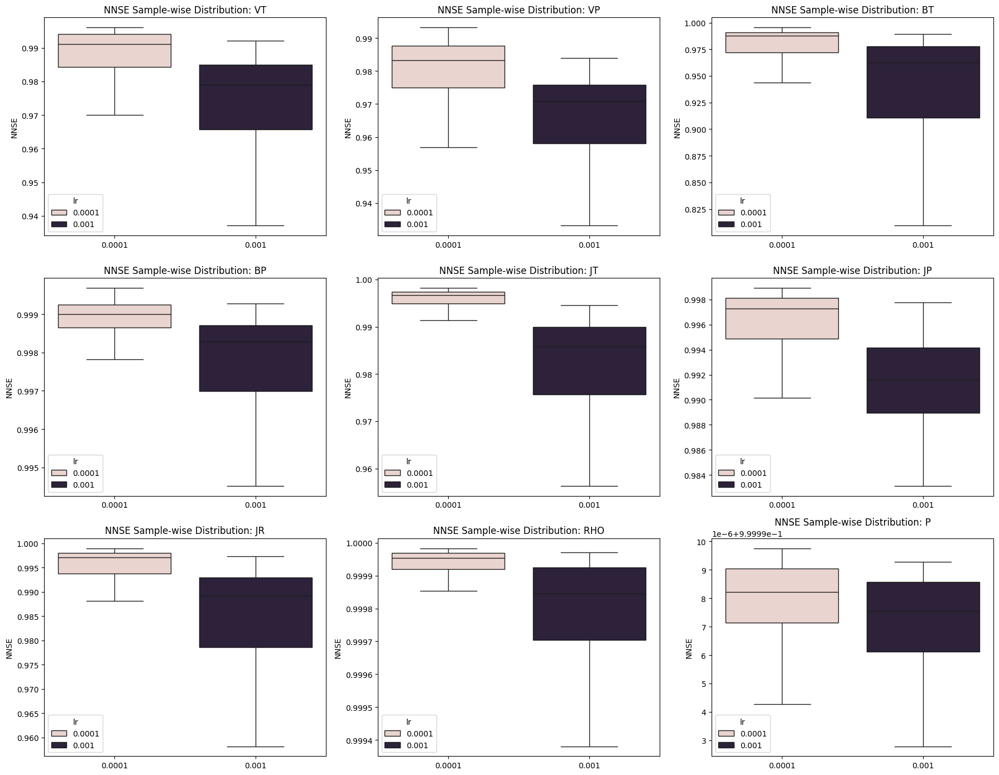

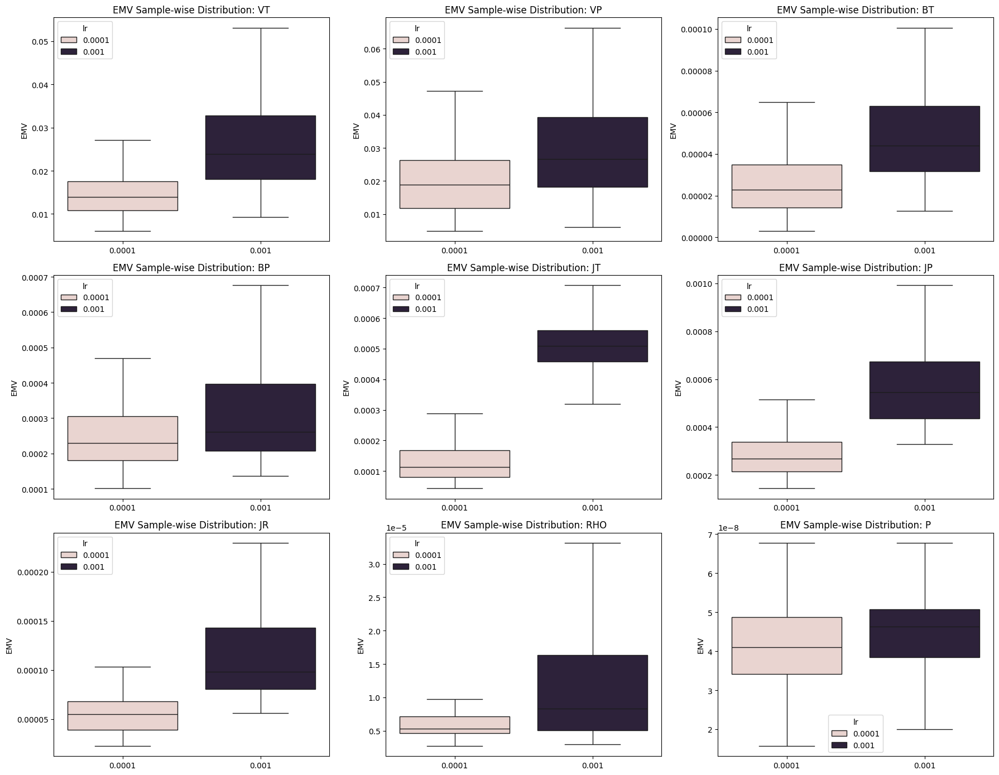

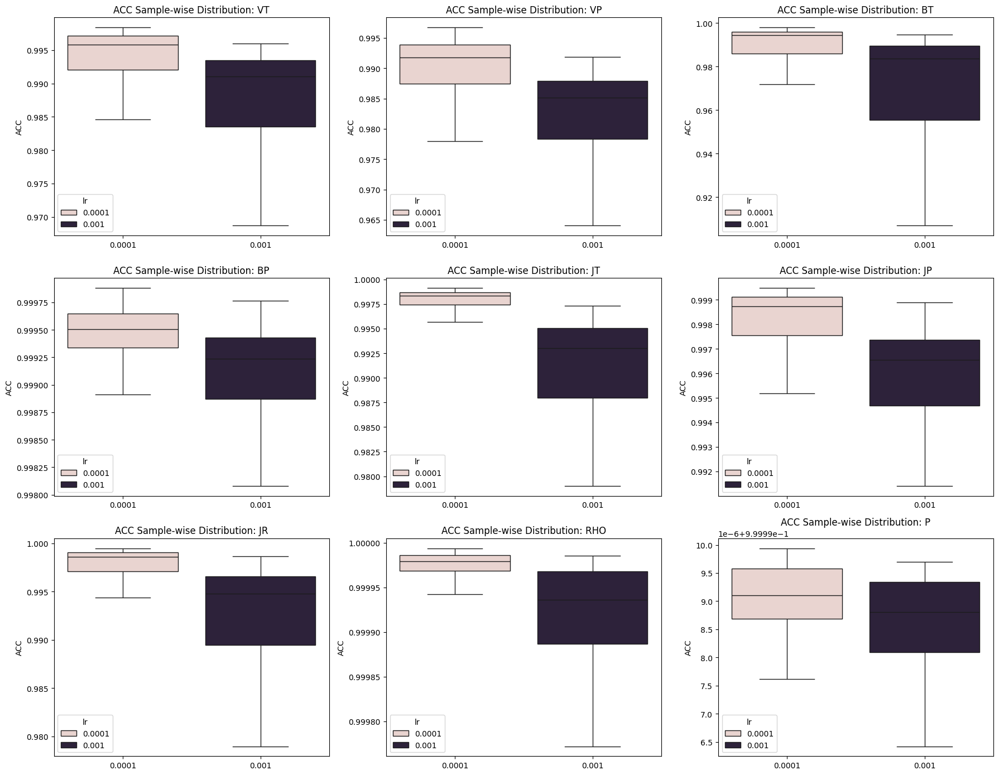

In [48]:
for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
    metric_df = result_lr_df[result_lr_df['metric'] == metric]
    
    fig, axes = plt.subplots(3, 3, figsize=(18, 14), sharey=False)
    axes = axes.flatten()
    
    for i, comp in enumerate(component_list):
        sns.boxplot(
            data=metric_df,
            x="lr",              # distribution per run
            y=comp,               # PSNR values for this component
            hue="lr",           # color by rank
            ax=axes[i],
            showfliers=False,
            # palette="Blues",
            # legend=False
            # showfliers=True,
        )
        axes[i].set_title(f"{metric} Sample-wise Distribution: {comp.upper()}")
        axes[i].set_xlabel("")
        axes[i].set_ylabel(metric)
        axes[i].tick_params(axis="x", rotation=0)
        # axes[i].legend(title="Rank")
        # axes[i].legend_.remove()
    
    plt.tight_layout()
    plt.savefig(os.path.join('gradnorm/lr', f'lr_{metric}.png'), dpi=200)
    plt.savefig(os.path.join('gradnorm/lr', f'lr_{metric}.pdf'), dpi=200)
    plt.show()

# Gradnorm $\alpha$ Ablation

In [82]:
job_id_descriptors = {
    '2026_05_18__021130': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-3, 'alpha':1.0},
    '2026_05_13__071503': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-3, 'alpha':1.5},
    '2026_05_18__020818': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-3, 'alpha':2.5},
    '2026_05_20__204526': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.0},
    '2026_05_18__020744': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5},
    '2026_05_19__230139': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':2.5},
}

for job in job_id_descriptors.keys():
    if job_id_descriptors[job]['gradnorm'] == 'False':
        f = np.load(os.path.join(BASE_DIR, job,'test_best_epoch_per_sample_per_component.npz'))
    else:
        f = np.load(os.path.join('/data/solar_wind_pred_vignesh/ParamNetwork', job,'test_best_epoch_per_sample_per_component.npz'))
    for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
        job_id_descriptors[job][metric] = f[metric]

result_rows = []

for run_name, run_data in job_id_descriptors.items():
    for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
        metric_values = run_data[metric]
        row_dict = {}
        for idx, val in enumerate(metric_values):
            row_dict = {component_list[comp]: v for comp, v in enumerate(val)}
            for k, v in run_data.items():
                row_dict[k] = run_data[k]
            row_dict['job'] = run_name
            row_dict['metric'] = metric
            
            result_rows.append(row_dict)

result_alpha_df = pd.DataFrame(result_rows)
print(result_alpha_df.shape)
result_alpha_df.head(n=5)

(6588, 21)


,vt,vp,bt,bp,jt,jp,jr,rho,p,rank,...,lr,alpha,MSE,PSNR,UQI,NNSE,EMV,ACC,job,metric
0,0.005428,0.005308,6.470635e-09,1.974127e-07,2.436604e-07,6.730966e-07,4.008679e-08,2.858629e-10,1.766390e-14,0.4,...,0.001,1.0,"[[0.0054280697, 0.005307564, 6.470635e-09, 1.9...","[[39.531246, 35.179806, 43.621006, 42.209568, ...","[[0.9142488, 0.9541785, 0.85867745, 0.9970256,...","[[0.98808354, 0.9856845, 0.9899664, 0.99884146...","[[0.010745966, 0.014010375, 1.864701e-05, 0.00...","[[0.99400485, 0.99275565, 0.9950592, 0.9995966...",2026_05_18__021130,MSE
1,0.005920,0.007966,9.179620e-09,2.170266e-07,3.961497e-07,9.887926e-07,5.571536e-08,3.064050e-10,1.280342e-14,0.4,...,0.001,1.0,"[[0.0054280697, 0.005307564, 6.470635e-09, 1.9...","[[39.531246, 35.179806, 43.621006, 42.209568, ...","[[0.9142488, 0.9541785, 0.85867745, 0.9970256,...","[[0.98808354, 0.9856845, 0.9899664, 0.99884146...","[[0.010745966, 0.014010375, 1.864701e-05, 0.00...","[[0.99400485, 0.99275565, 0.9950592, 0.9995966...",2026_05_18__021130,MSE
2,0.007686,0.018124,2.655310e-08,1.321732e-06,1.493659e-06,2.722985e-06,1.624395e-07,1.621541e-09,3.319451e-14,0.4,...,0.001,1.0,"[[0.0054280697, 0.005307564, 6.470635e-09, 1.9...","[[39.531246, 35.179806, 43.621006, 42.209568, ...","[[0.9142488, 0.9541785, 0.85867745, 0.9970256,...","[[0.98808354, 0.9856845, 0.9899664, 0.99884146...","[[0.010745966, 0.014010375, 1.864701e-05, 0.00...","[[0.99400485, 0.99275565, 0.9950592, 0.9995966...",2026_05_18__021130,MSE
3,0.003973,0.004060,7.319984e-09,1.466987e-07,1.571097e-07,3.439405e-07,2.638061e-08,1.521900e-10,8.170895e-15,0.4,...,0.001,1.0,"[[0.0054280697, 0.005307564, 6.470635e-09, 1.9...","[[39.531246, 35.179806, 43.621006, 42.209568, ...","[[0.9142488, 0.9541785, 0.85867745, 0.9970256,...","[[0.98808354, 0.9856845, 0.9899664, 0.99884146...","[[0.010745966, 0.014010375, 1.864701e-05, 0.00...","[[0.99400485, 0.99275565, 0.9950592, 0.9995966...",2026_05_18__021130,MSE
4,0.005207,0.005999,1.090505e-08,1.506697e-07,1.827668e-07,5.141582e-07,4.000133e-08,1.653099e-10,1.204184e-14,0.4,...,0.001,1.0,"[[0.0054280697, 0.005307564, 6.470635e-09, 1.9...","[[39.531246, 35.179806, 43.621006, 42.209568, ...","[[0.9142488, 0.9541785, 0.85867745, 0.9970256,...","[[0.98808354, 0.9856845, 0.9899664, 0.99884146...","[[0.010745966, 0.014010375, 1.864701e-05, 0.00...","[[0.99400485, 0.99275565, 0.9950592, 0.9995966...",2026_05_18__021130,MSE


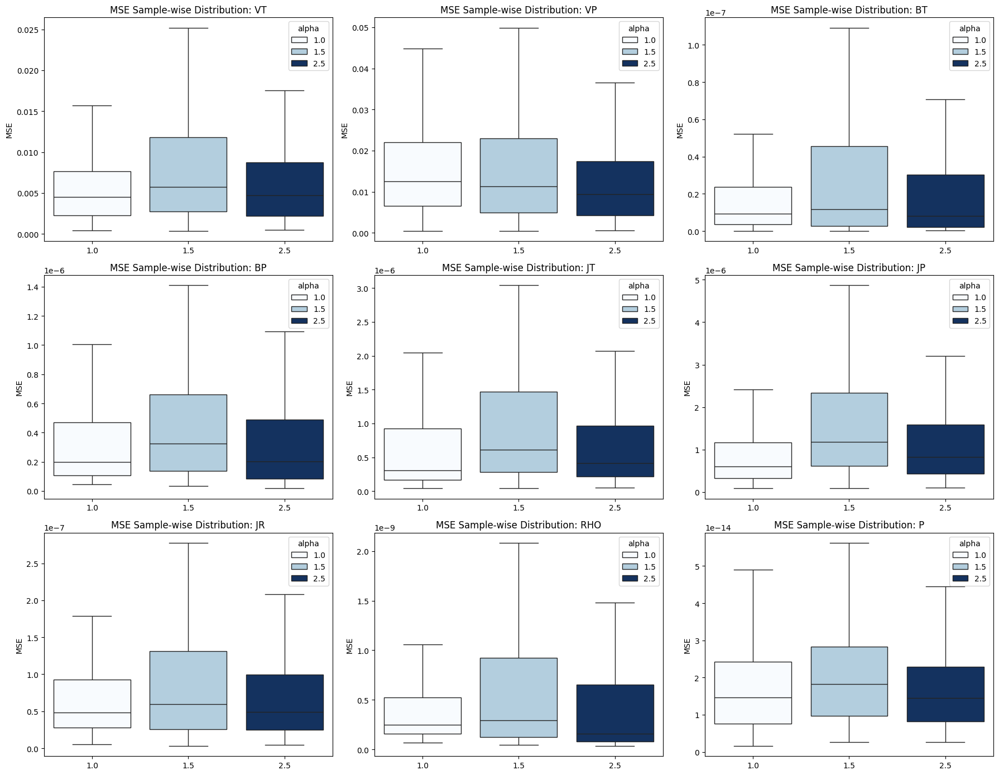

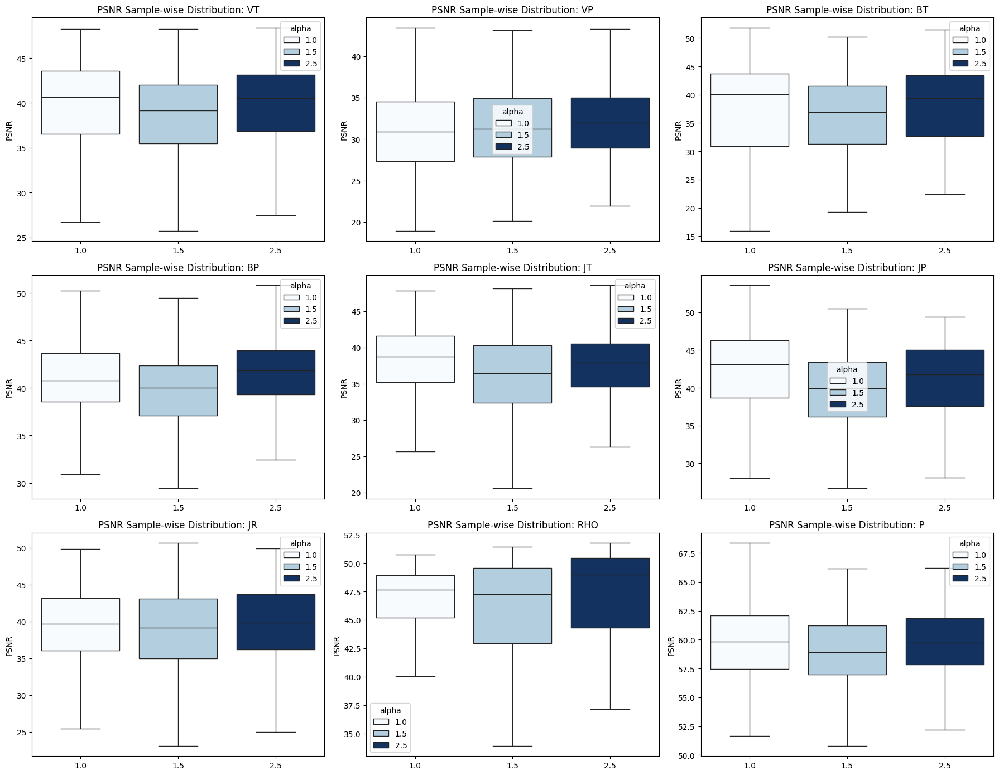

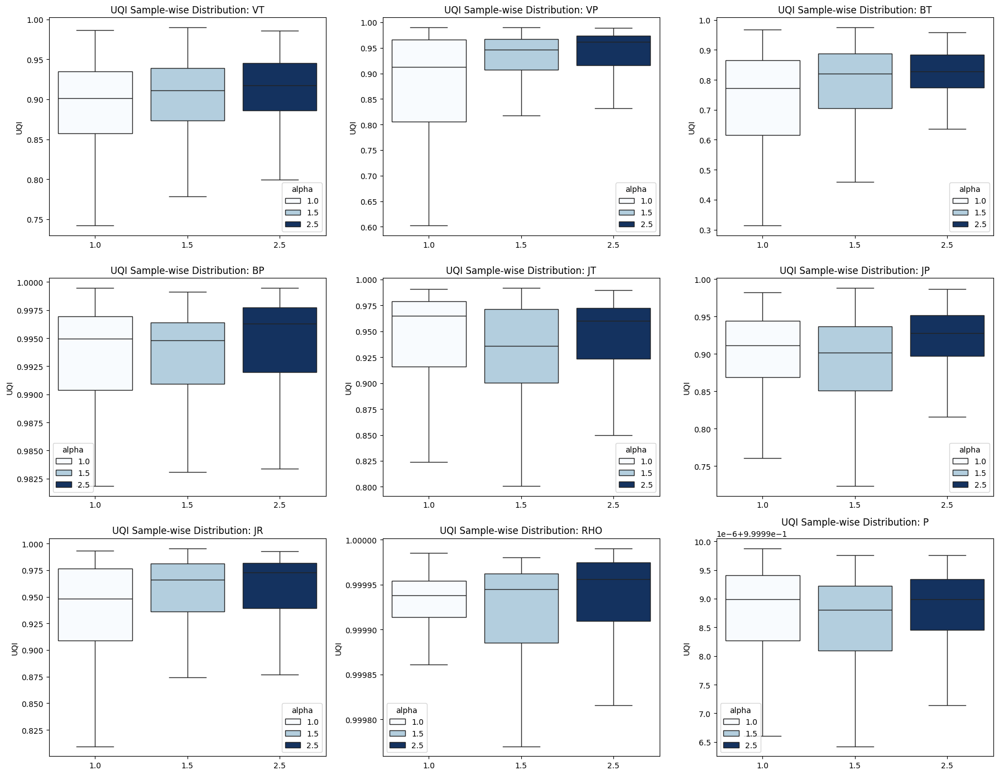

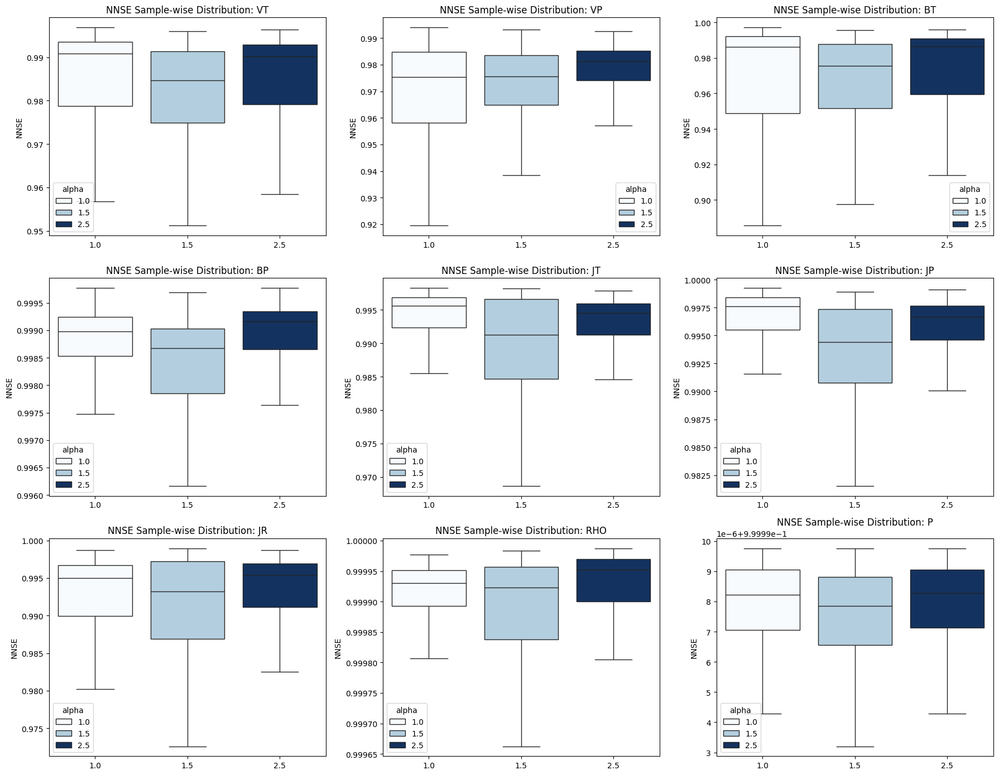

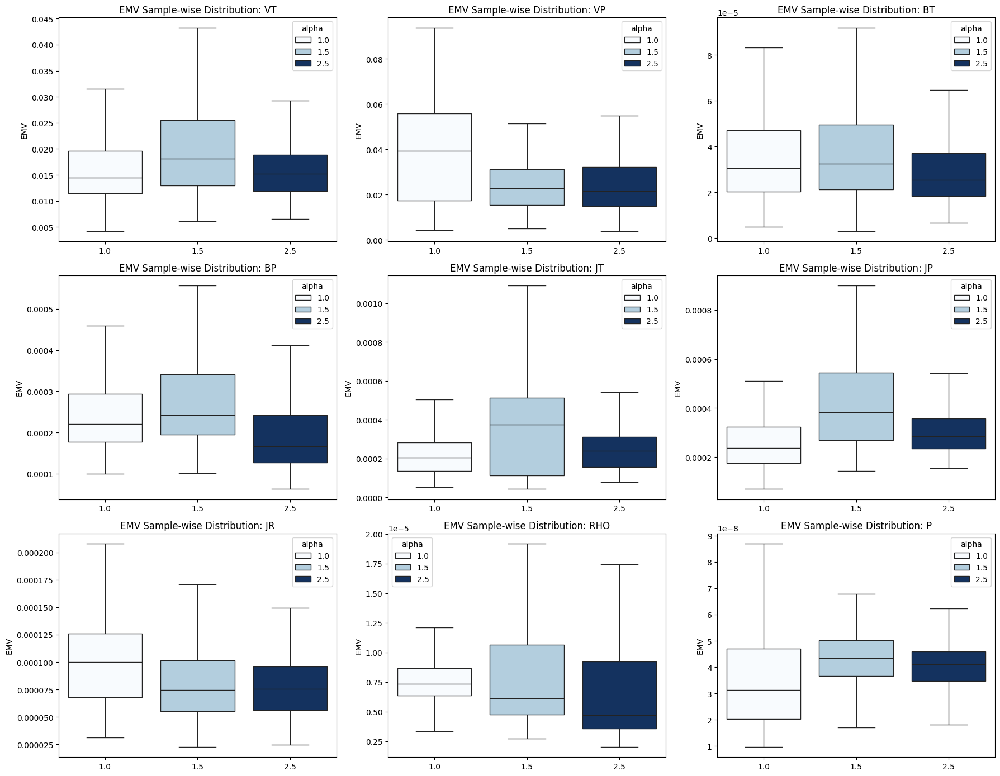

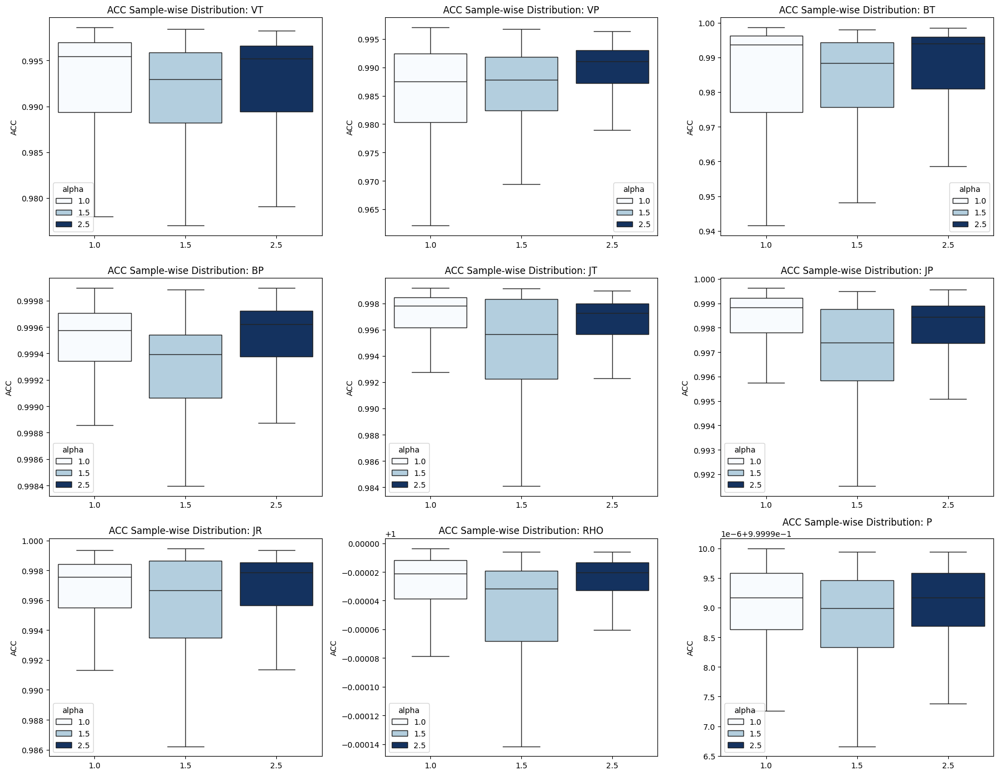

In [83]:
for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
    metric_df = result_alpha_df[result_alpha_df['metric'] == metric]
    
    fig, axes = plt.subplots(3, 3, figsize=(18, 14), sharey=False)
    axes = axes.flatten()
    
    for i, comp in enumerate(component_list):
        sns.boxplot(
            data=metric_df,
            x="alpha",              # distribution per run
            y=comp,               # PSNR values for this component
            hue="alpha",           # color by rank
            ax=axes[i],
            showfliers=False,
            palette="Blues",
            # legend=False
            # showfliers=True,
        )
        axes[i].set_title(f"{metric} Sample-wise Distribution: {comp.upper()}")
        axes[i].set_xlabel("")
        axes[i].set_ylabel(metric)
        axes[i].tick_params(axis="x", rotation=0)
        # axes[i].legend(title="Rank")
        # axes[i].legend_.remove()
    
    plt.tight_layout()
    plt.savefig(os.path.join('gradnorm/alpha', f'alpha_{metric}.png'), dpi=200)
    plt.savefig(os.path.join('gradnorm/alpha', f'alpha_{metric}.pdf'), dpi=200)
    plt.show()

# Combined plots

## Box Plot

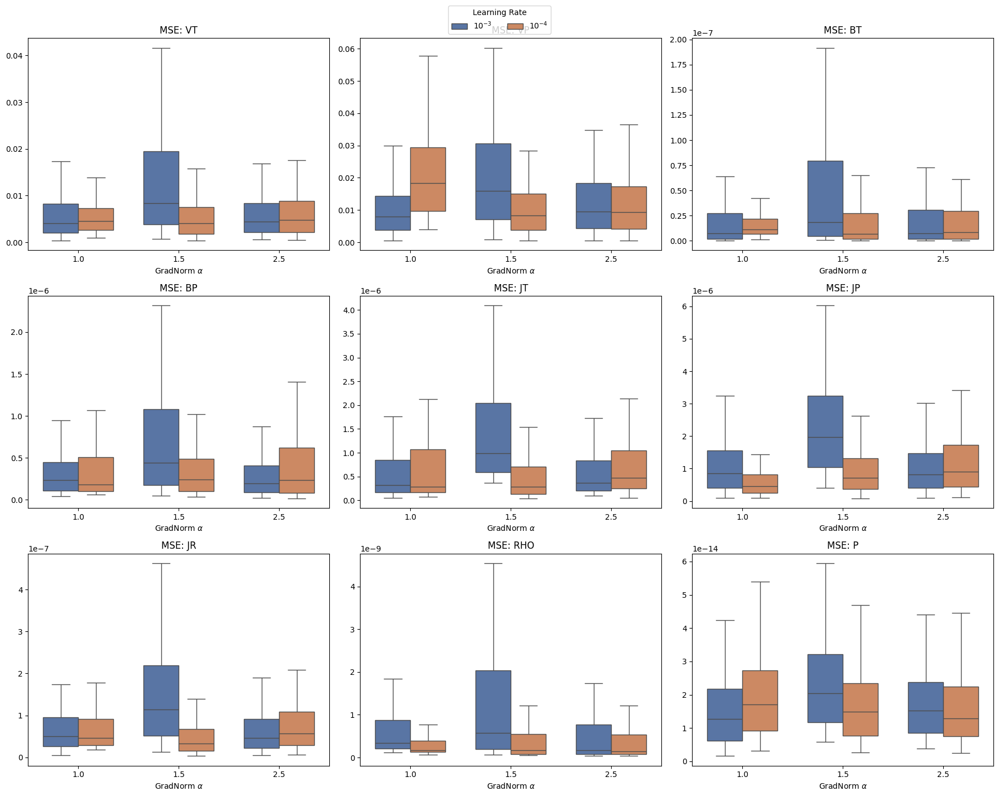

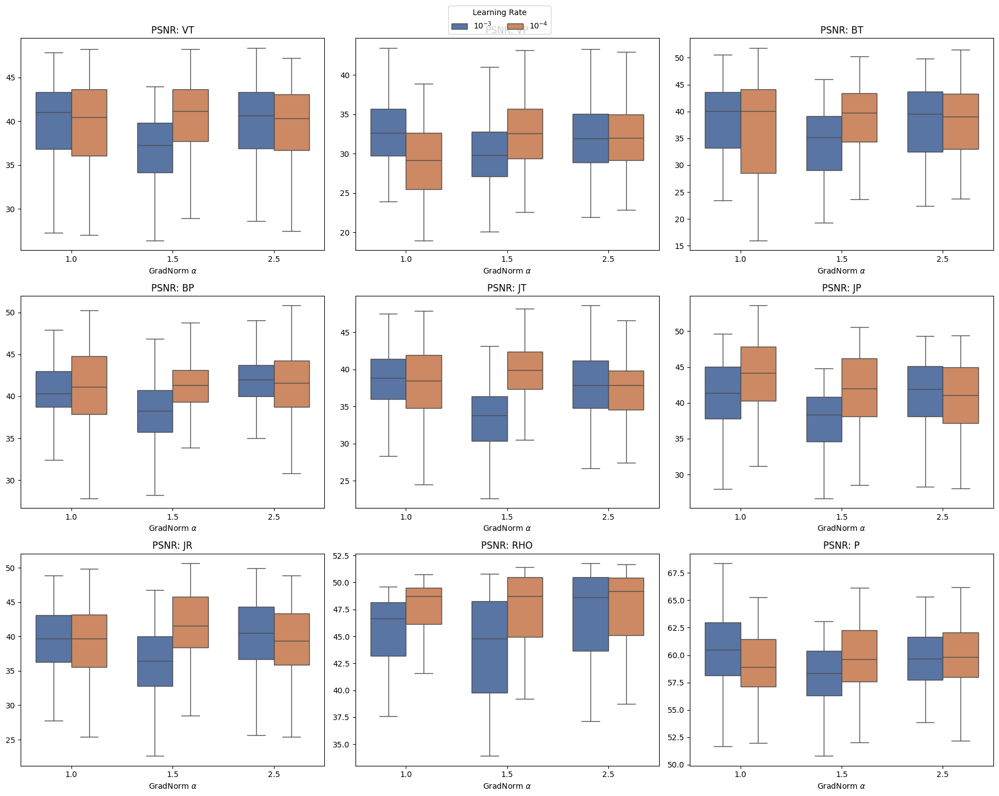

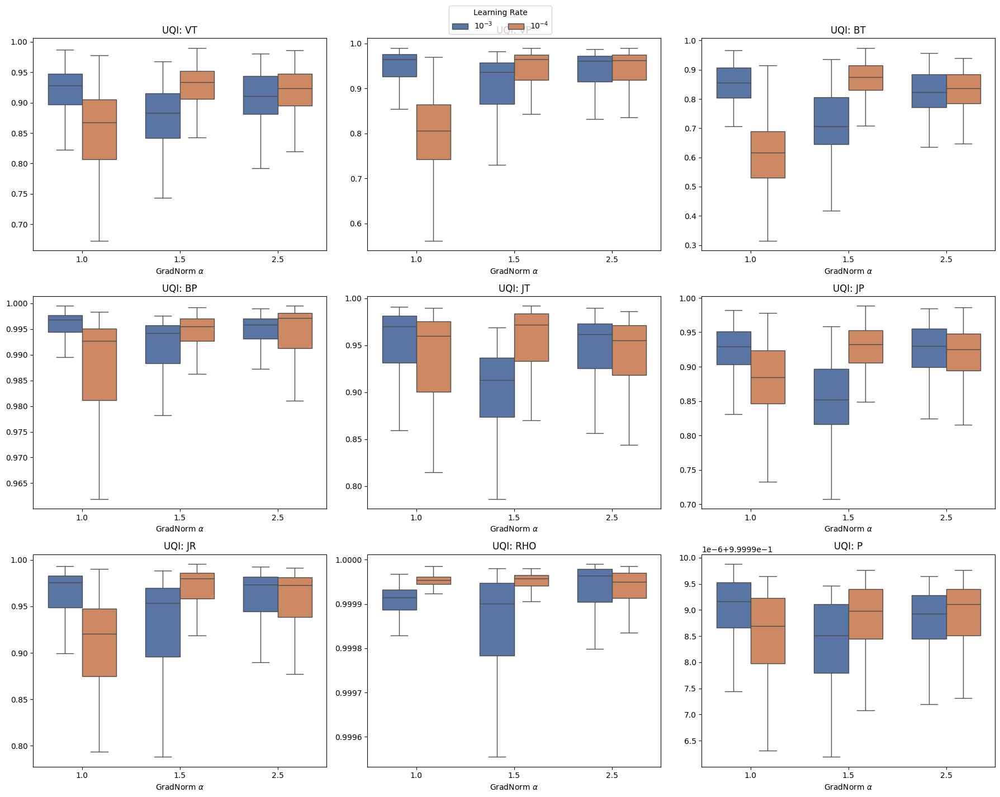

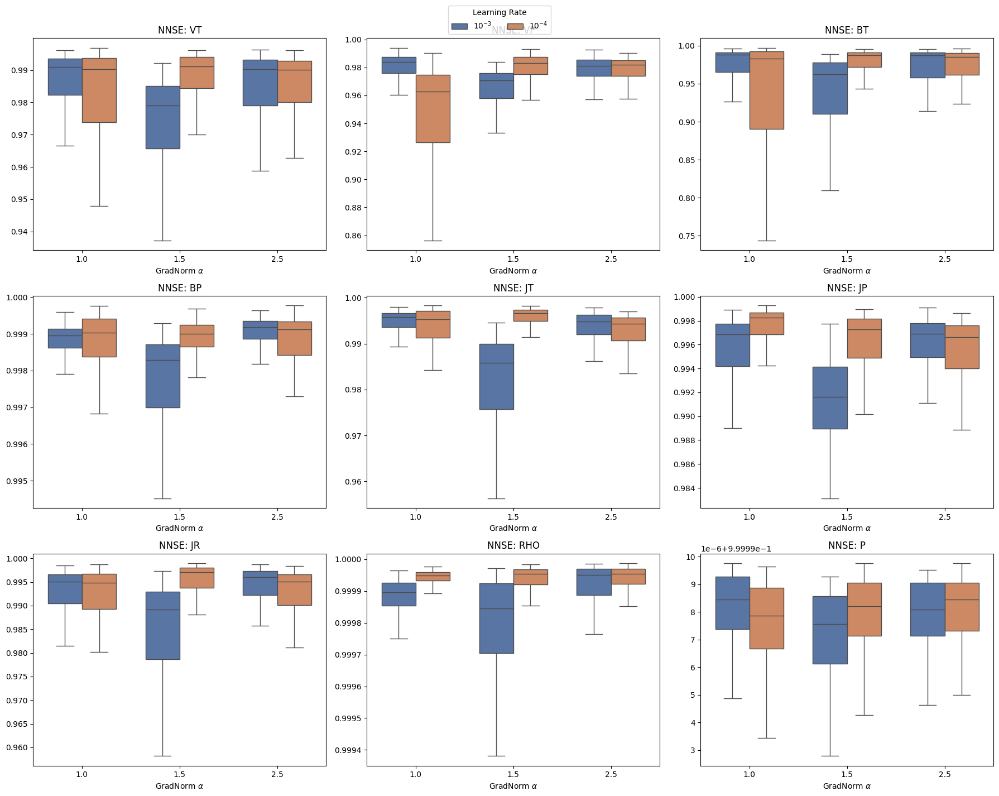

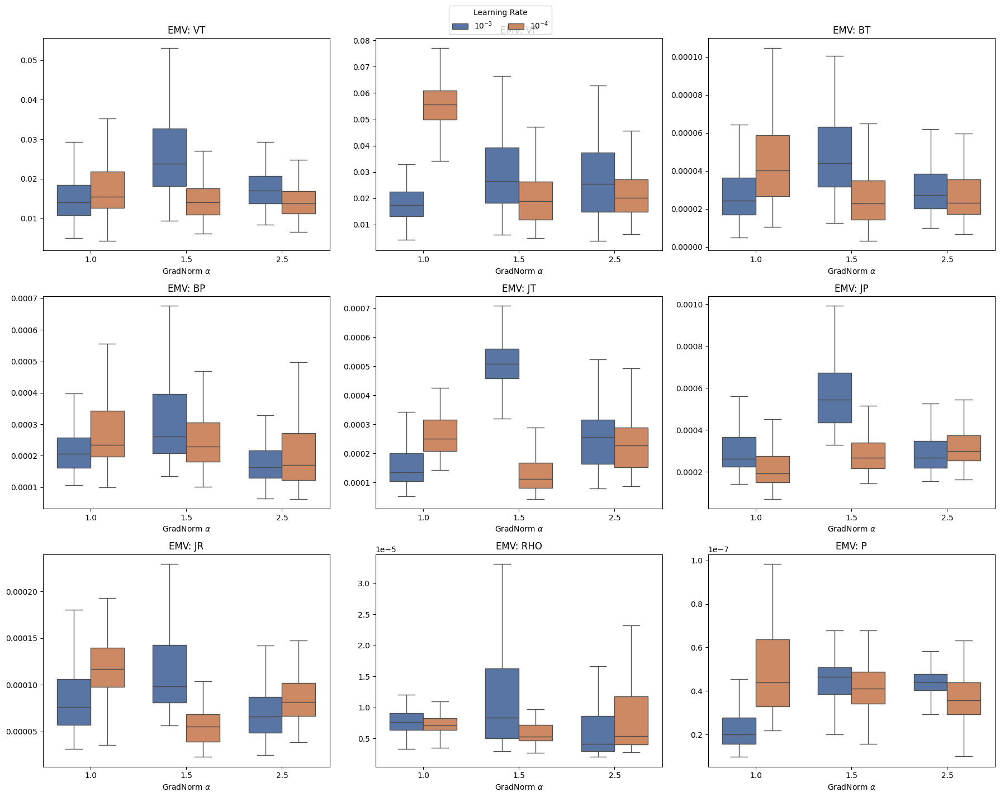

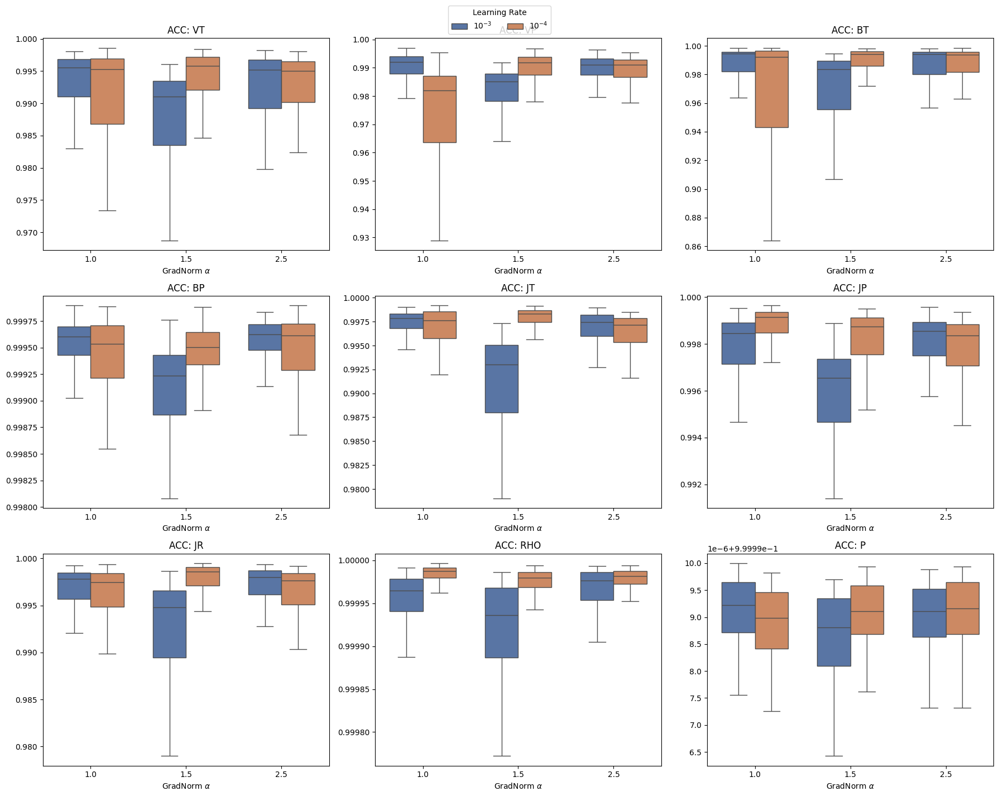

In [89]:
# Optional: make lr labels cleaner for legend
result_alpha_df["lr_label"] = result_alpha_df["lr"].map({
    1e-3: r"$10^{-3}$",
    1e-4: r"$10^{-4}$"
})
palette = {
    r"$10^{-3}$": "#4C72B0",
    r"$10^{-4}$": "#DD8452",
}

for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
    metric_df = result_alpha_df[result_alpha_df["metric"] == metric].copy()

    fig, axes = plt.subplots(3, 3, figsize=(18, 14), sharey=False)
    axes = axes.flatten()

    for i, comp in enumerate(component_list):
        sns.boxplot(
            data=metric_df,
            x="alpha",
            y=comp,
            hue="lr_label",
            ax=axes[i],
            showfliers=False,
            palette=palette,
            width=0.7
        )

        axes[i].set_title(f"{metric}: {comp.upper()}")
        axes[i].set_xlabel(r"GradNorm $\alpha$")
        axes[i].set_ylabel("")
        axes[i].tick_params(axis="x", rotation=0)

        # Keep only one legend for the whole figure
        if axes[i].get_legend() is not None:
            axes[i].get_legend().remove()

    # Create shared legend from first axis handles
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles,
        labels,
        title="Learning Rate",
        loc="upper center",
        ncol=2,
        bbox_to_anchor=(0.5, 1.02)
    )

    plt.tight_layout()

    plt.savefig(
        os.path.join("/app/docs/resources/exp_1/combined", f"alpha_lr_{metric}_boxplot.png"),
        dpi=200,
        bbox_inches="tight"
    )
    plt.savefig(
        os.path.join("/app/docs/resources/exp_1/combined", f"alpha_lr_{metric}_boxplot.pdf"),
        dpi=200,
        bbox_inches="tight"
    )

    plt.show()

## Violin Plot

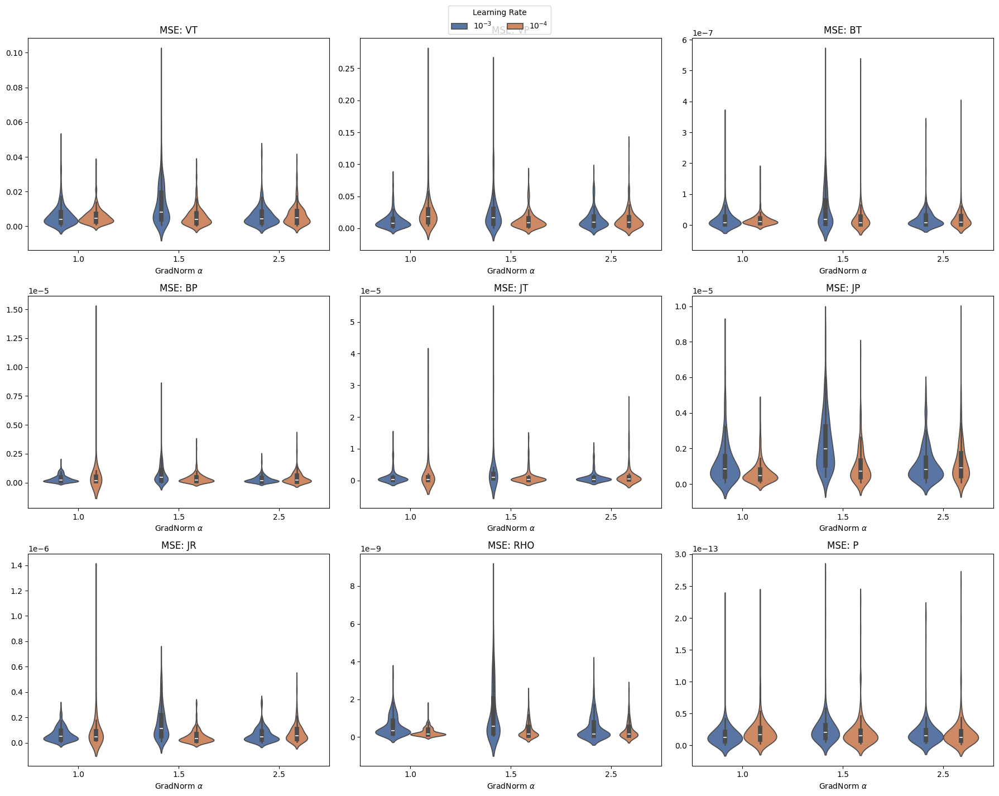

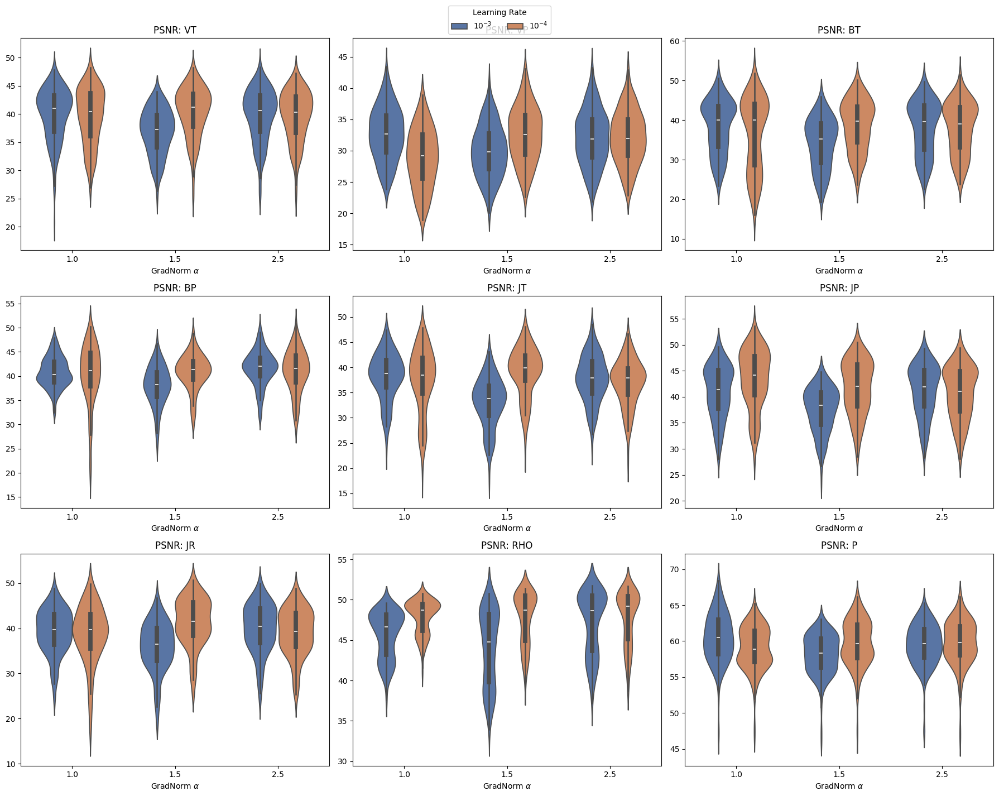

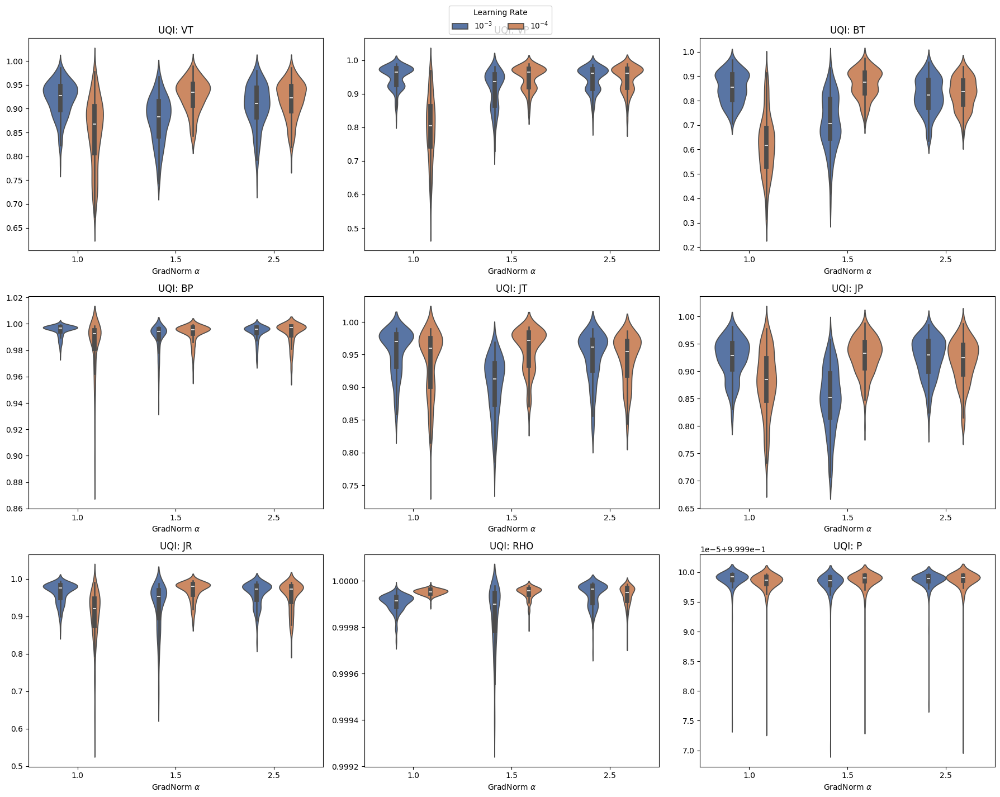

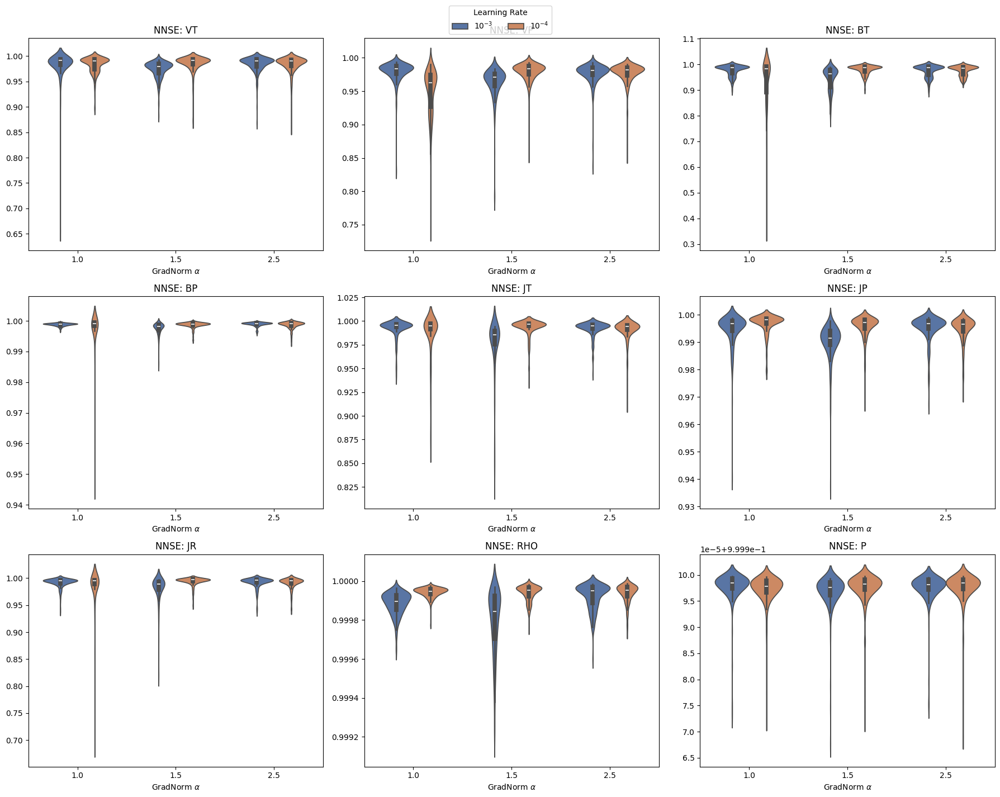

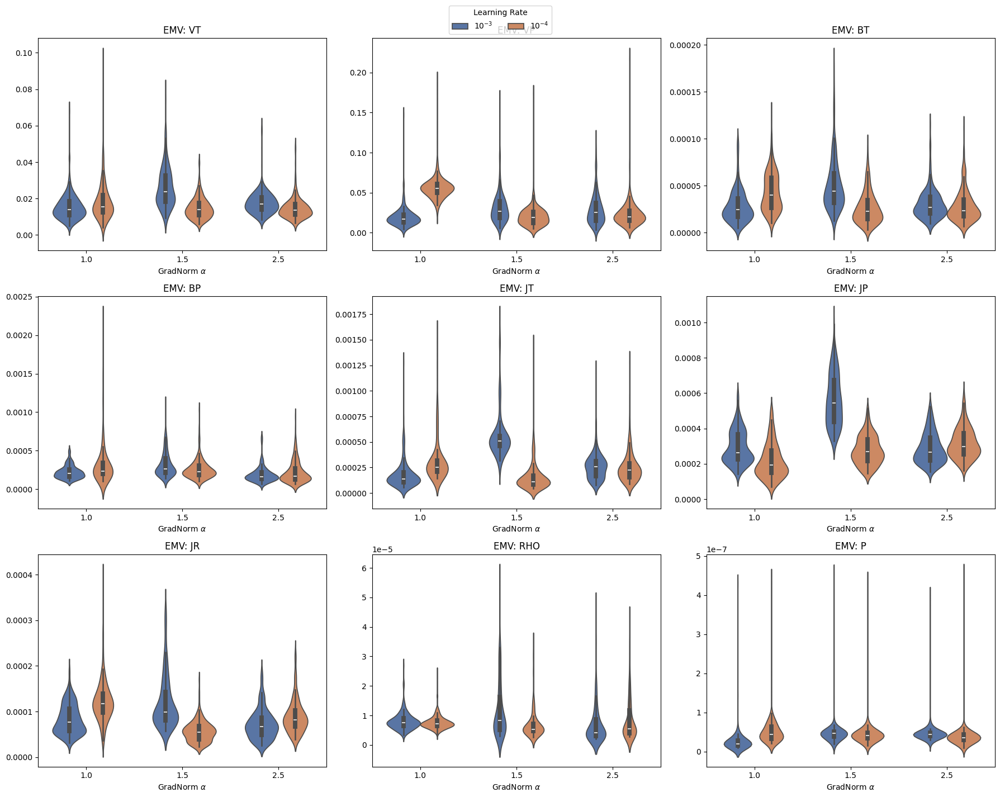

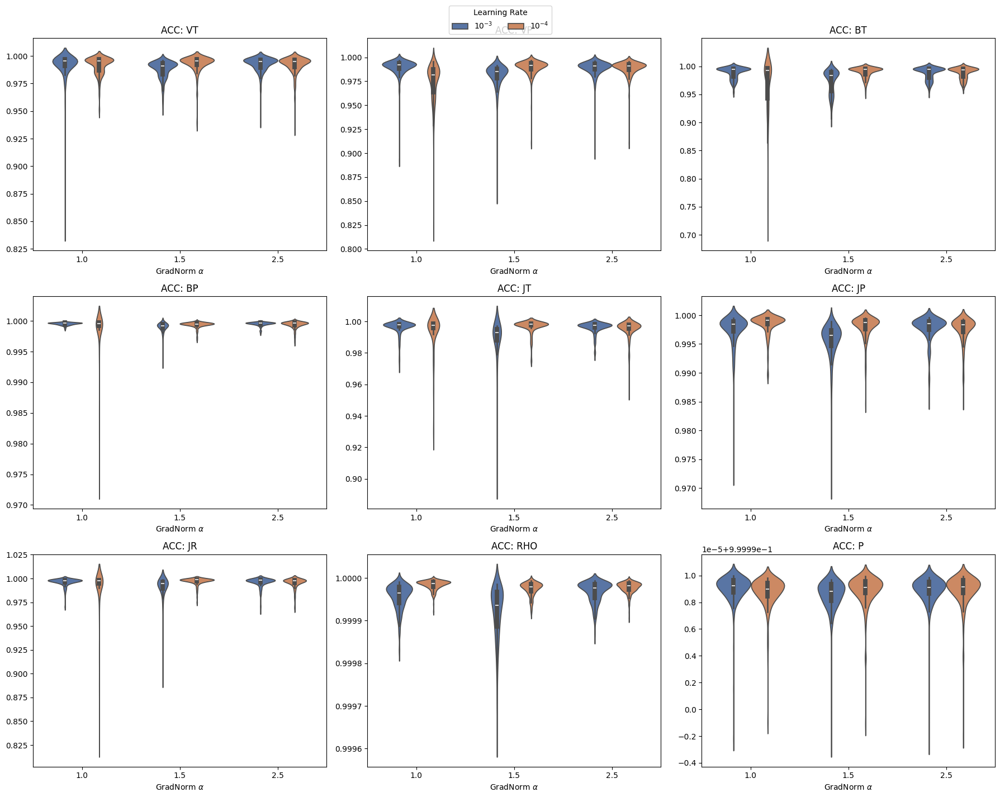

In [85]:
# Optional: make lr labels cleaner for legend
result_alpha_df["lr_label"] = result_alpha_df["lr"].map({
    1e-3: r"$10^{-3}$",
    1e-4: r"$10^{-4}$"
})
palette = {
    r"$10^{-3}$": "#4C72B0",
    r"$10^{-4}$": "#DD8452",
}

for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
    metric_df = result_alpha_df[result_alpha_df["metric"] == metric].copy()

    fig, axes = plt.subplots(3, 3, figsize=(18, 14), sharey=False)
    axes = axes.flatten()

    for i, comp in enumerate(component_list):
        sns.violinplot(
            data=metric_df,
            x="alpha",
            y=comp,
            hue="lr_label",
            ax=axes[i],
            # showfliers=False,
            palette=palette,
            width=0.7
        )

        axes[i].set_title(f"{metric}: {comp.upper()}")
        axes[i].set_xlabel(r"GradNorm $\alpha$")
        axes[i].set_ylabel("")
        axes[i].tick_params(axis="x", rotation=0)

        # Keep only one legend for the whole figure
        if axes[i].get_legend() is not None:
            axes[i].get_legend().remove()

    # Create shared legend from first axis handles
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles,
        labels,
        title="Learning Rate",
        loc="upper center",
        ncol=2,
        bbox_to_anchor=(0.5, 1.02)
    )

    plt.tight_layout()

    plt.savefig(
        os.path.join("/app/docs/resources/exp_1/combined", f"alpha_lr_{metric}.png"),
        dpi=200,
        bbox_inches="tight"
    )
    plt.savefig(
        os.path.join("/app/docs/resources/exp_1/combined", f"alpha_lr_{metric}.pdf"),
        dpi=200,
        bbox_inches="tight"
    )

    plt.show()

# Data Transform Ablation

In [3]:
job_id_descriptors = {
    '2026_05_18__020744': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5, 'transform': 'sqrt'},
    '2026_05_20__204646': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5, 'transform': 'log'},
    '2026_05_26__195949': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5, 'transform': 'arcsinh'},
    '2026_05_26__200347': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5, 'transform': 'sqrt_vB'},
    '2026_05_27__215227': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5, 'transform': 'sinh_arcsinh'},
}

for job in job_id_descriptors.keys():
    if job_id_descriptors[job]['gradnorm'] == 'False':
        f = np.load(os.path.join(BASE_DIR, job,'test_best_epoch_per_sample_per_component.npz'))
    else:
        f = np.load(os.path.join('/data/solar_wind_pred_vignesh/ParamNetwork', job,'test_best_epoch_per_sample_per_component.npz'))
    for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
        job_id_descriptors[job][metric] = f[metric]

result_rows = []

for run_name, run_data in job_id_descriptors.items():
    for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
        metric_values = run_data[metric]
        row_dict = {}
        for idx, val in enumerate(metric_values):
            row_dict = {component_list[comp]: v for comp, v in enumerate(val)}
            for k, v in run_data.items():
                row_dict[k] = run_data[k]
            row_dict['job'] = run_name
            row_dict['metric'] = metric
            
            result_rows.append(row_dict)

result_transform_df = pd.DataFrame(result_rows)
print(result_transform_df.shape)

(5490, 22)


## Box Plot

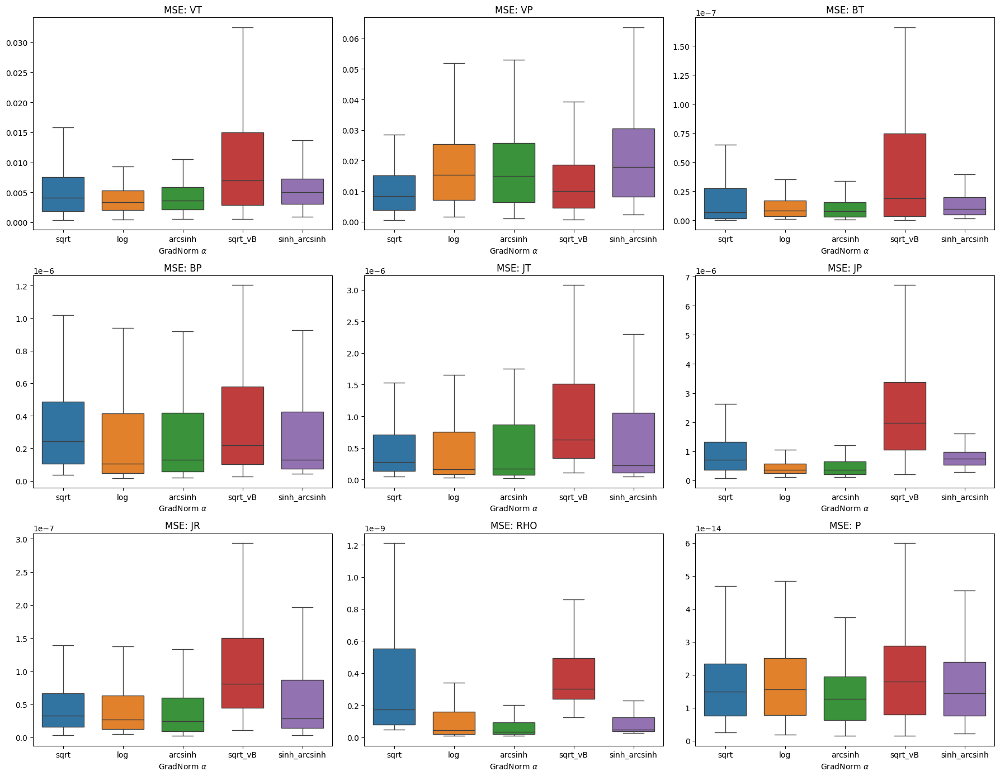

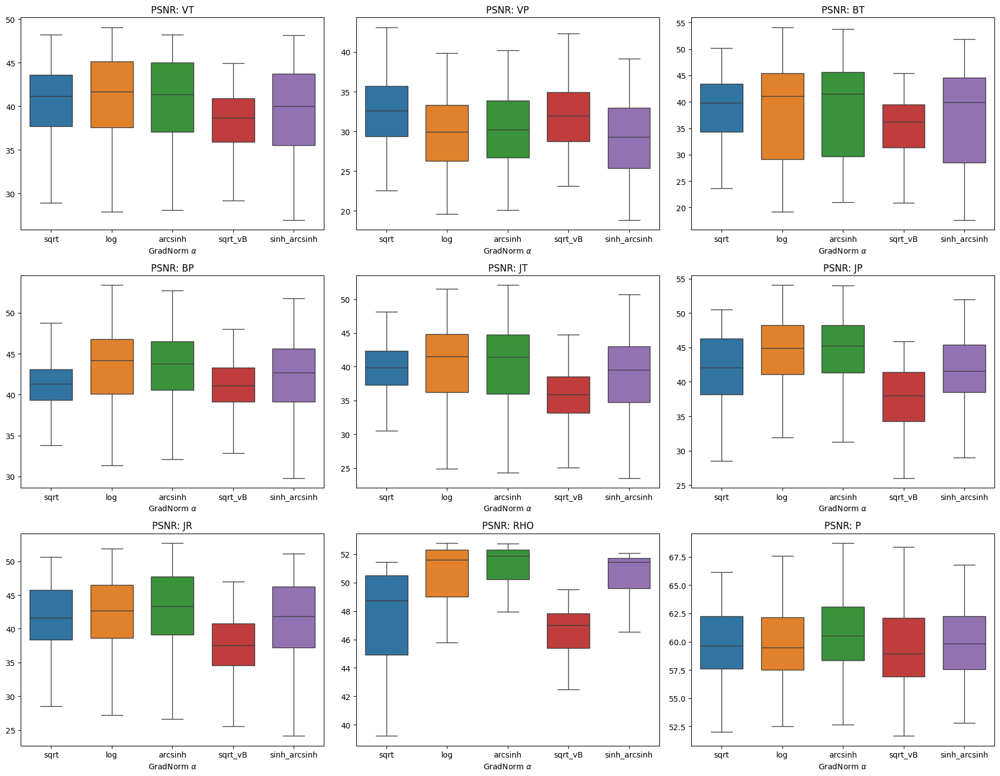

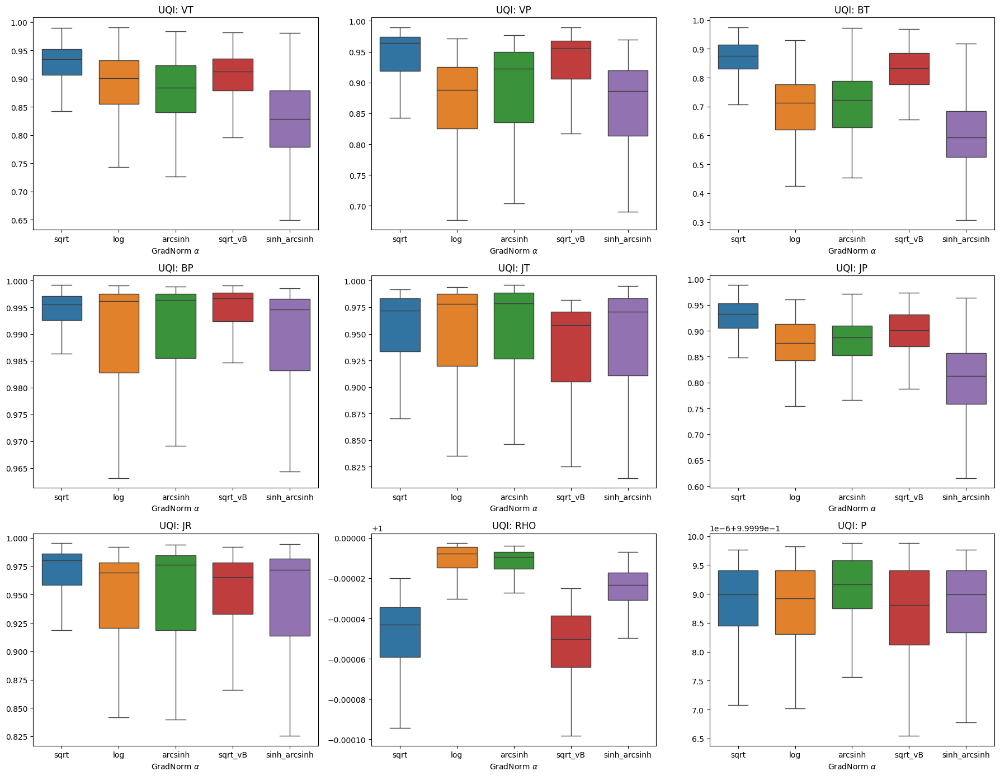

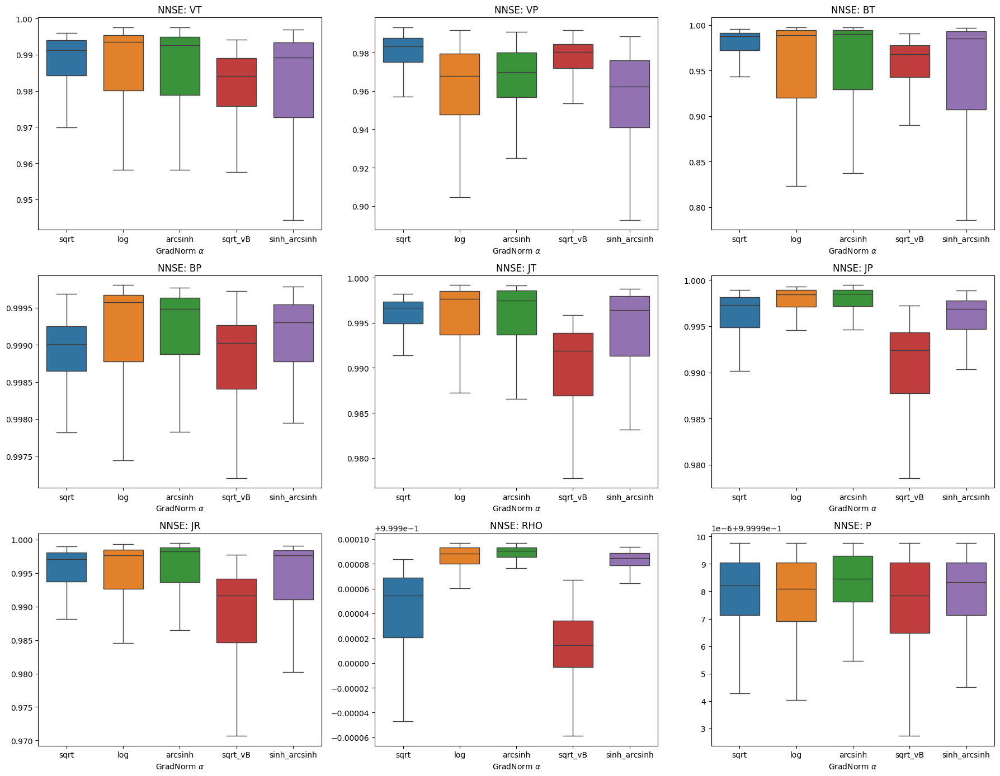

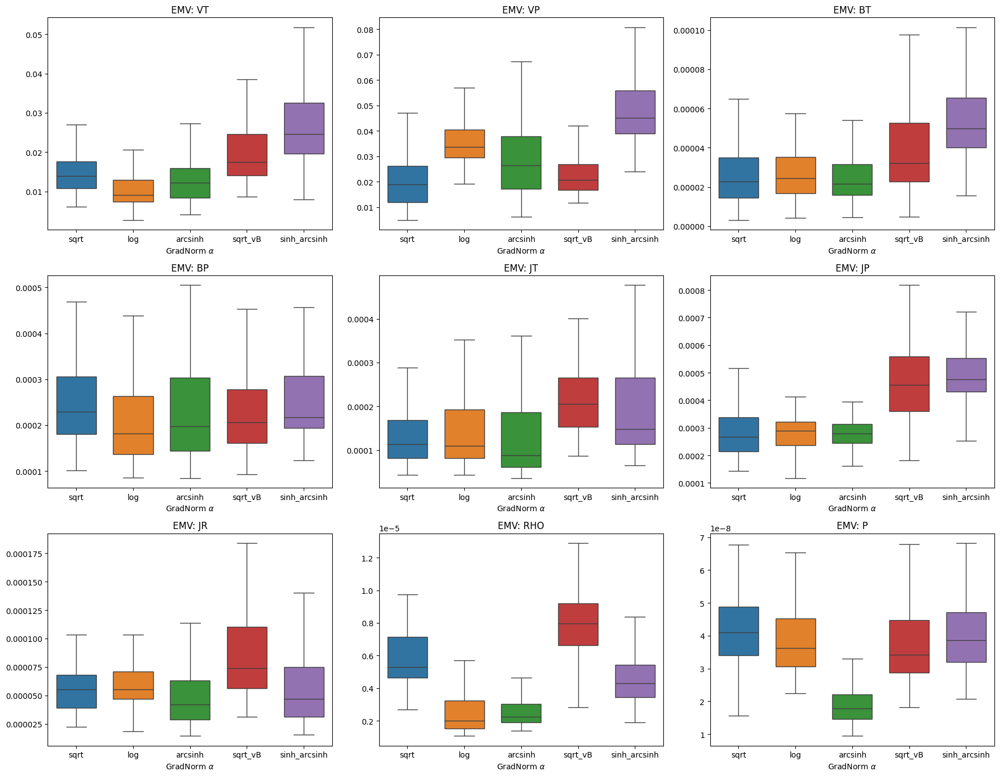

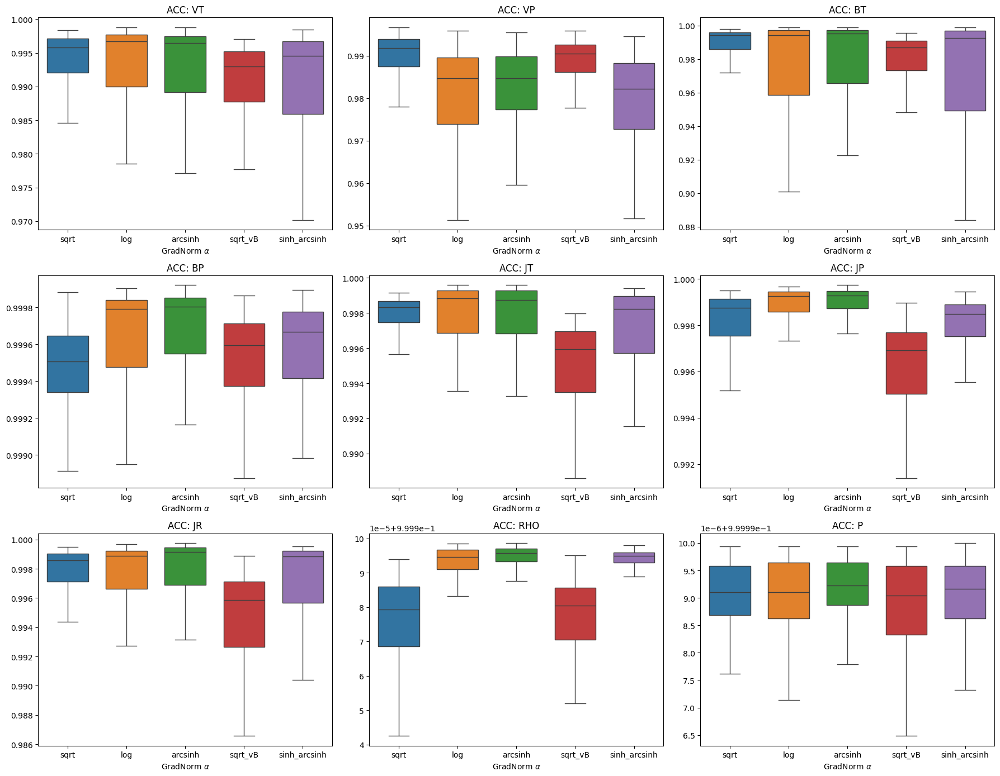

In [4]:
for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
    metric_df = result_transform_df[result_transform_df["metric"] == metric].copy()

    fig, axes = plt.subplots(3, 3, figsize=(18, 14), sharey=False)
    axes = axes.flatten()

    for i, comp in enumerate(component_list):
        sns.boxplot(
            data=metric_df,
            x="transform",
            y=comp,
            hue="transform",
            ax=axes[i],
            showfliers=False,
            # palette=palette,
            width=0.7
        )

        axes[i].set_title(f"{metric}: {comp.upper()}")
        axes[i].set_xlabel(r"GradNorm $\alpha$")
        axes[i].set_ylabel("")
        axes[i].tick_params(axis="x", rotation=0)

        # Keep only one legend for the whole figure
        if axes[i].get_legend() is not None:
            axes[i].get_legend().remove()

    plt.tight_layout()

    plt.savefig(
        os.path.join("/app/docs/resources/exp_2/transform", f"transform_{metric}_boxplot.png"),
        dpi=200,
        bbox_inches="tight"
    )
    plt.savefig(
        os.path.join("/app/docs/resources/exp_2/transform", f"transform_{metric}_boxplot.pdf"),
        dpi=200,
        bbox_inches="tight"
    )

    plt.show()

## Violin Plot

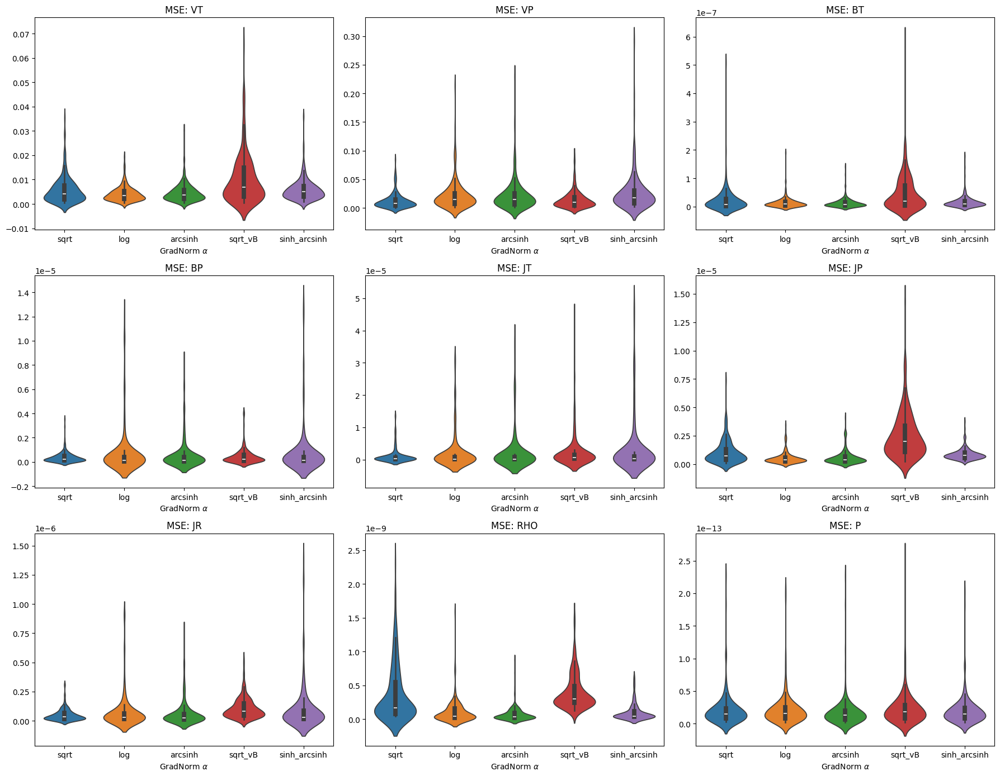

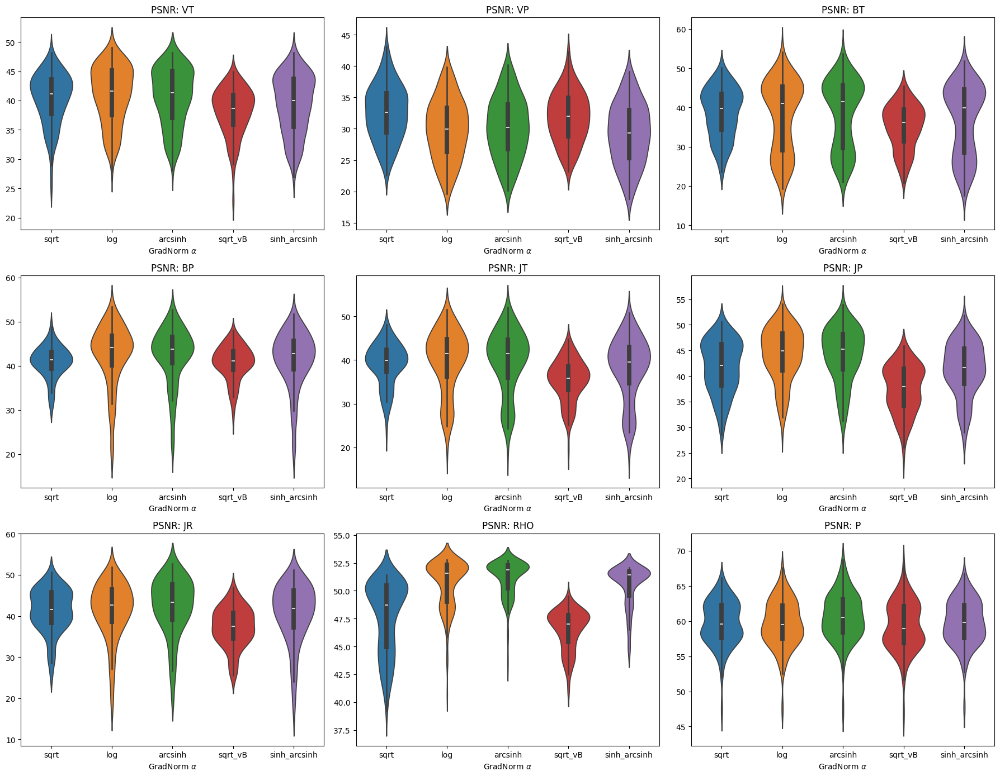

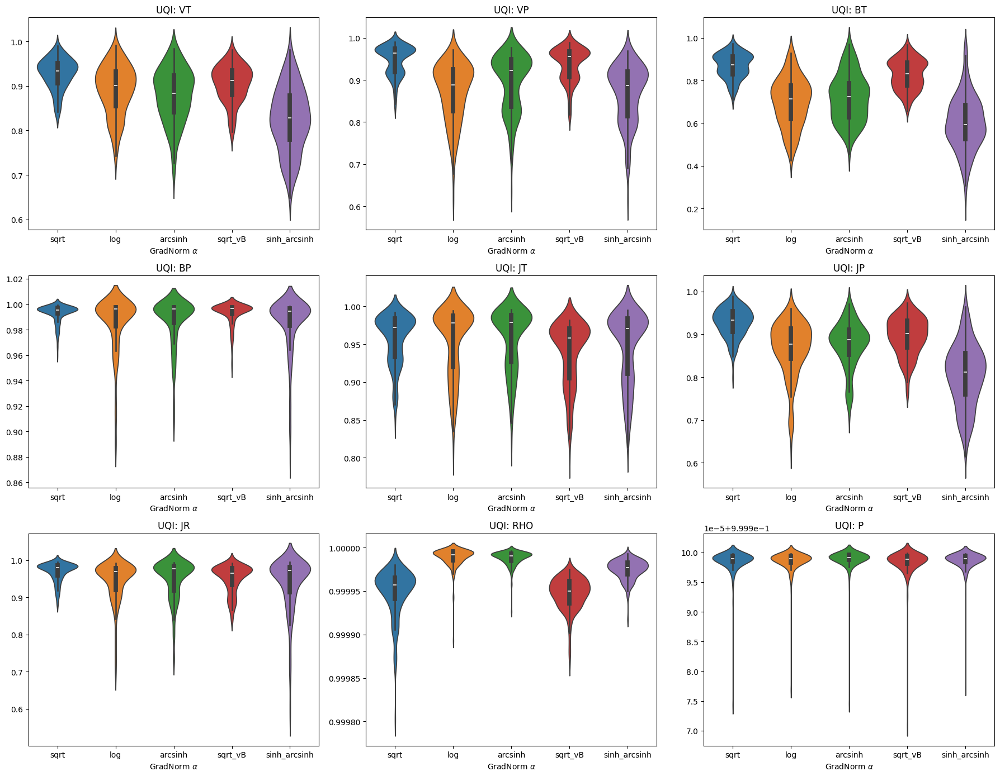

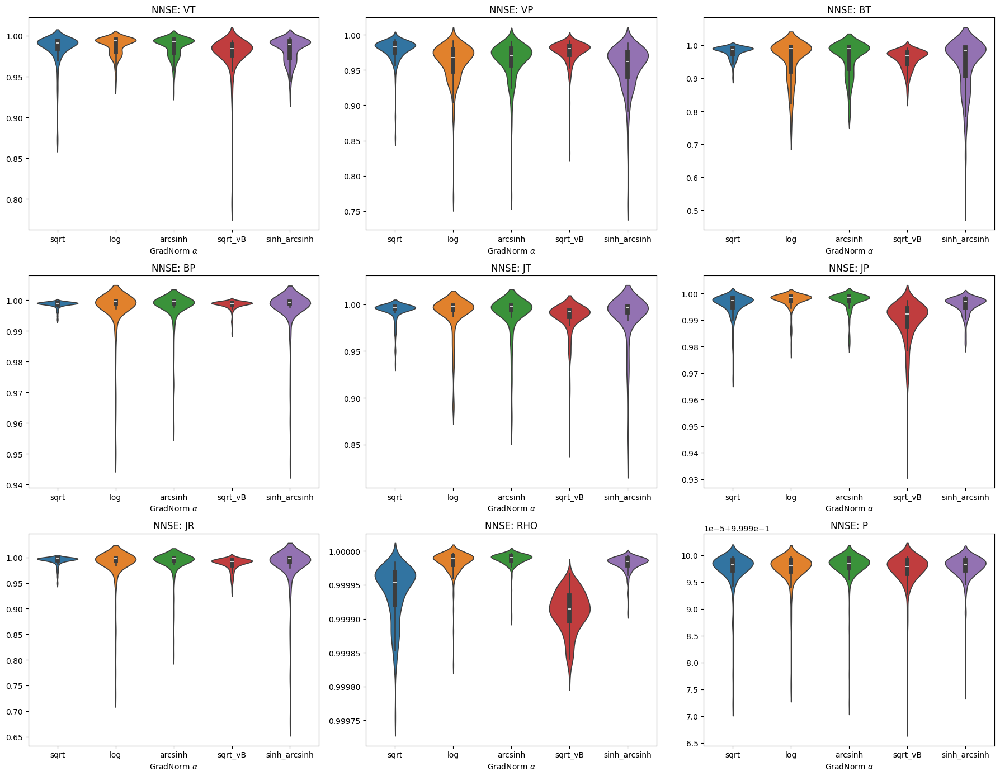

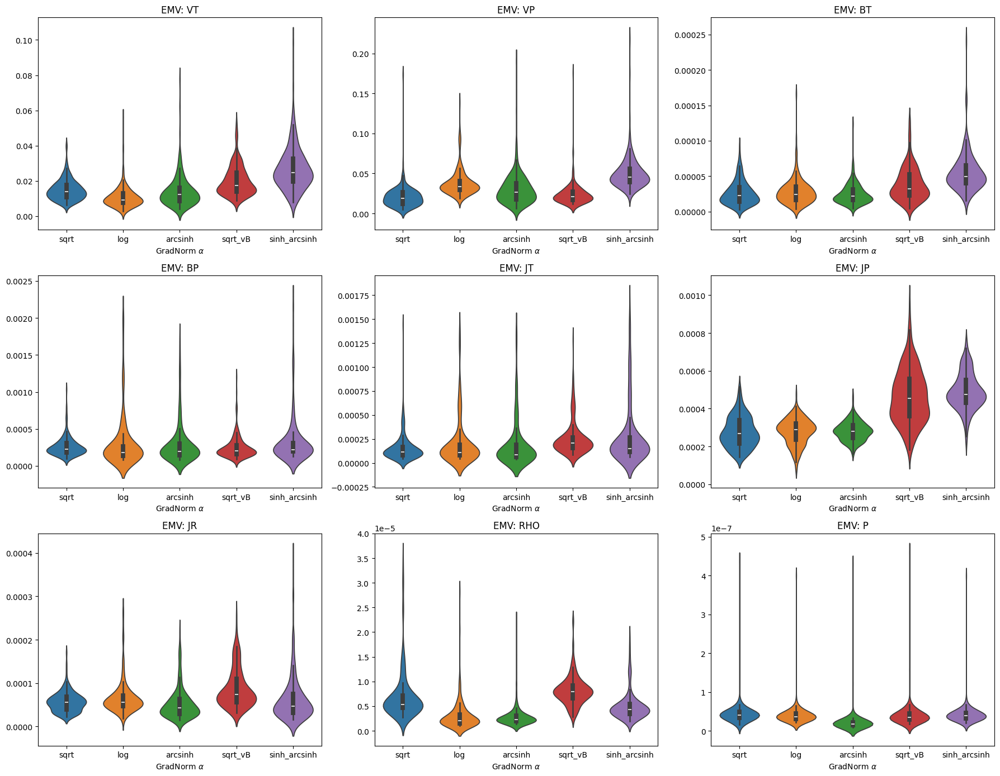

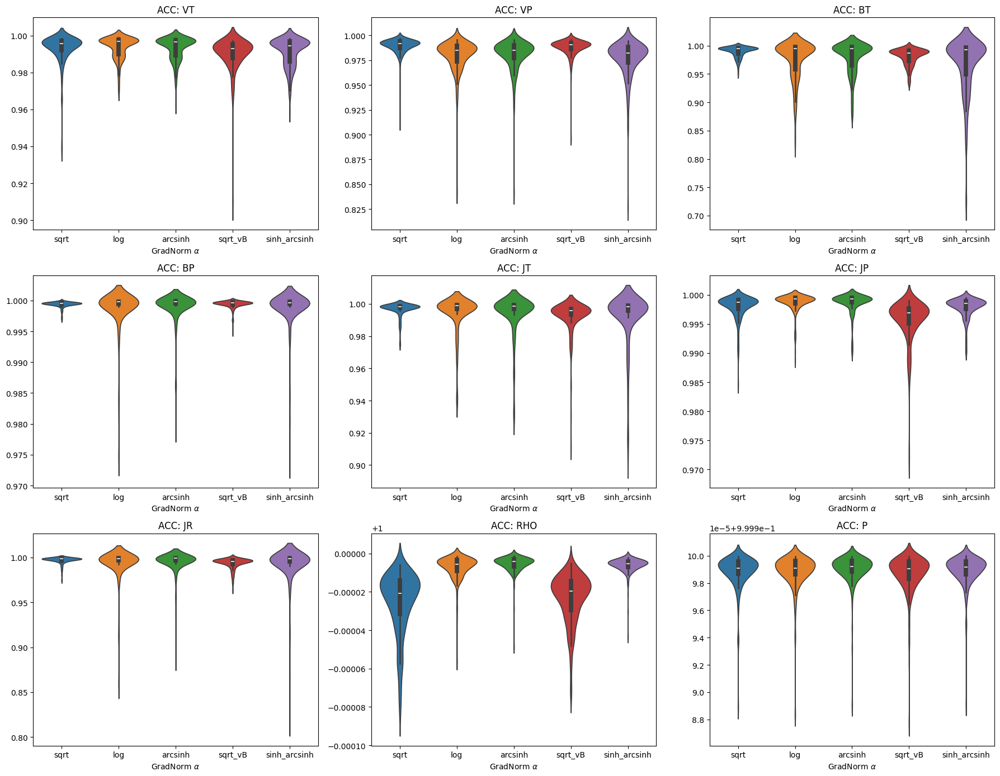

In [5]:
# Optional: make lr labels cleaner for legend
# result_alpha_df["lr_label"] = result_alpha_df["lr"].map({
#     1e-3: r"$10^{-3}$",
#     1e-4: r"$10^{-4}$"
# })
# palette = {
#     r"$10^{-3}$": "#4C72B0",
#     r"$10^{-4}$": "#DD8452",
# }

for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
    metric_df = result_transform_df[result_transform_df["metric"] == metric].copy()

    fig, axes = plt.subplots(3, 3, figsize=(18, 14), sharey=False)
    axes = axes.flatten()

    for i, comp in enumerate(component_list):
        sns.violinplot(
            data=metric_df,
            x="transform",
            y=comp,
            hue="transform",
            ax=axes[i],
            # showfliers=False,
            # palette=palette,
            width=0.7
        )

        axes[i].set_title(f"{metric}: {comp.upper()}")
        axes[i].set_xlabel(r"GradNorm $\alpha$")
        axes[i].set_ylabel("")
        axes[i].tick_params(axis="x", rotation=0)

        # Keep only one legend for the whole figure
        if axes[i].get_legend() is not None:
            axes[i].get_legend().remove()

    plt.tight_layout()

    plt.savefig(
        os.path.join("/app/docs/resources/exp_2/transform", f"transform_{metric}.png"),
        dpi=200,
        bbox_inches="tight"
    )
    plt.savefig(
        os.path.join("/app/docs/resources/exp_2/transform", f"transform_{metric}.pdf"),
        dpi=200,
        bbox_inches="tight"
    )

    plt.show()

In [47]:
med_data.sims.shape

(907, 11, 109, 128)

In [48]:
data = med_data.sims[0].reshape((11,-1))

In [49]:
transforms_dict = [
    {'transform': 'sqrt'},
    {'transform': 'log'},
    {'transform': 'arcsinh'},
    {'transform': 'sinh_arcsinh', 'delta': 1, 'epsilon': 0},
    {'transform': 'sinh_arcsinh', 'delta': 2, 'epsilon': 0},
    {'transform': 'sinh_arcsinh', 'delta': 0.5, 'epsilon': 0},
    {'transform': 'sinh_arcsinh', 'delta': 1.5, 'epsilon': 0},
    {'transform': 'sinh_arcsinh', 'delta': 1, 'epsilon': 1},
    {'transform': 'sinh_arcsinh', 'delta': 1, 'epsilon': -1},
]

In [50]:
tf_len = len(transforms_dict)

In [51]:
def signed_sqrt_transform(array):
    return np.sign(array) * (np.abs(array)**0.5)

def signed_pow_transform(array, power):
    return np.sign(array) * (np.abs(array)**power)

def signed_log_transform(array):
    return np.sign(array) * np.log(np.abs(array)+1)

def arcsinh_transform(array):
    return np.arcsinh(array)

def sinh_arcsinh_transform(array, epsilon=0.0, delta=1.0):
    """
    Sinh-arcsinh transformation.

    epsilon controls skewness.
    delta controls tail weight.

    epsilon = 0 and delta = 1 gives identity transform.
    delta > 1 reduces tail heaviness.
    delta < 1 increases tail heaviness.
    """
    return np.sinh(delta * np.arcsinh(array) - epsilon)

def signed_transform(array, transform='sqrt', power=None, epsilon=0.0, delta=1.0):
    if transform == 'sqrt':
        return signed_sqrt_transform(array)
    elif transform == 'log':
        return signed_log_transform(array)
    elif transform == 'pow' and power is not None:
        return signed_pow_transform(array, power)
    elif transform == 'arcsinh':
        return arcsinh_transform(array)
    elif transform == 'sinh_arcsinh':
        return sinh_arcsinh_transform(array, epsilon=epsilon, delta=delta)
    else:
        raise ValueError("Unsupported transform type or missing power for 'pow' transform.")

def data_transformation(array, transform='sqrt', power=None, epsilon=0.0, delta=1.0):  
    """
    :param array: (11, H, W)
    Returns: array after data transformation 
    """
    # VR_0 -> No transformation required
    array[:,0] = signed_transform(array[:,0], transform=transform, power=power, epsilon=epsilon, delta=delta)   # Sign-preserving data transformation
    # BR_0 -> No transformation required
    array[:,1] = signed_transform(array[:,1], transform=transform, power=power, epsilon=epsilon, delta=delta)   # Sign-preserving data transformation

    # VT_0
    array[:,2] = signed_transform(array[:,2], transform=transform, power=power, epsilon=epsilon, delta=delta)   # Sign-preserving data transformation
    # VP_0
    array[:,3] = signed_transform(array[:,3], transform=transform, power=power, epsilon=epsilon, delta=delta)   # Sign-preserving data transformation
    # BT_0
    array[:,4] = signed_transform(array[:,4], transform=transform, power=power, epsilon=epsilon, delta=delta)   # Sign-preserving data transformation
    # BP_0
    array[:,5] = signed_transform(array[:,5], transform=transform, power=power, epsilon=epsilon, delta=delta)   # Sign-preserving data transformation
    # JT_0 -> No transformation required
    # JP_0
    array[:,7] = signed_transform(array[:,7], transform=transform, power=power, epsilon=epsilon, delta=delta)   # Sign-preserving data transformation
    # JR_0
    array[:,8] = signed_transform(array[:,8], transform=transform, power=power, epsilon=epsilon, delta=delta)   # Sign-preserving data transformation
    # RHO_0 -> No transformation required
    array[:,9] = signed_transform(array[:,9], transform=transform, power=power, epsilon=epsilon, delta=delta)   # Sign-preserving data transformation
    # P_0 
    array[:,10] = signed_transform(array[:,10], transform='pow', power=0.25)   # Sign-preserving POW(0.25) transformation
    return array

In [52]:
tf_data = np.zeros((tf_len+1,*data.shape))

In [53]:
tf_data[0] = data
for idx, tf_item in enumerate(transforms_dict):
    tf_arr = data_transformation(data, tf_item['transform'], tf_item.get('epsilon', 0), tf_item.get('delta', 1)) 
    tf_data[idx+1] = tf_arr

In [ ]:
fig, ax = plt.subplots(2*tf_len+1,9)
# Plot original data
for col, component in enumerate(component_list):
    sns.histplot(ax=ax[0,col], data=tf_data[0, col].reshape(-1))
for row, tf_item in enumerate(transforms_dict):
    # PLOT Distributions
    for col, component in enumerate(component_list):
        sns.histplot(ax=ax[2*row+1,col], data=tf_data[row+1, col])
    # PLOT Q-Q plots
        # stats.probplot(tf_data[row+1, col], plot=ax[2*row+2,col], dist='norm')
plt.plot()

In [54]:
tf_data.shape

(10, 11, 13952)

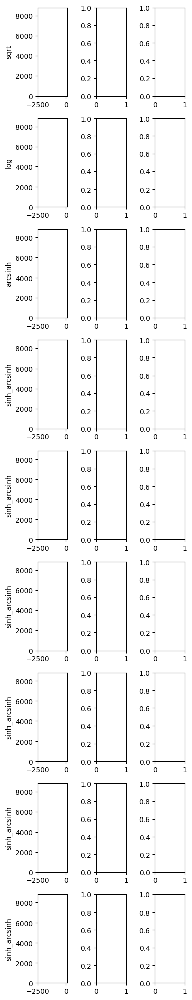

In [110]:
fig, ax = plt.subplots(9,3, figsize=(4,20))
for tf_idx, tf_dict in enumerate(transforms_dict):
    sns.histplot(ax=ax[tf_idx, 0], data=tf_data[0, 0])
    # sns.histplot(ax=ax[tf_idx, 1], data=tf_data[tf_idx, 0])
    # stats.probplot(tf_data[tf_idx, 0], plot=ax[tf_idx,2], dist='norm')
    ax[tf_idx,0].set_ylabel(f'{tf_dict["transform"]}')
    ax[tf_idx,1].set_ylabel(f'')
    ax[tf_idx,2].set_ylabel(f'')
    ax[tf_idx,2].set_xlabel(f'')
    ax[tf_idx,2].set_title(f'')
plt.tight_layout()

In [28]:
tf_data.shape

(10, 11, 13952)

## Custom Transformation

In [122]:
job_id_descriptors = {
    '2026_05_18__020744': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5, 'transform': 'sqrt'},
    # '2026_05_20__204646': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5, 'transform': 'log'},
    # '2026_05_26__195949': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5, 'transform': 'arcsinh'},
    # '2026_05_31__065608': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5, 'transform': 'custom_1'},
    '2026_06_01__052253': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5, 'transform': 'custom_2'},
    '2026_06_03__062026': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5, 'transform': 'custom_2_std'},
    '2026_06_03__062346': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5, 'transform': 'custom_2_q95'},
}

for job in job_id_descriptors.keys():
    if job_id_descriptors[job]['gradnorm'] == 'False':
        f = np.load(os.path.join(BASE_DIR, job,'test_best_epoch_per_sample_per_component.npz'))
    else:
        f = np.load(os.path.join('/data/solar_wind_pred_vignesh/ParamNetwork', job,'test_best_epoch_per_sample_per_component.npz'))
    for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
        job_id_descriptors[job][metric] = f[metric]

result_rows = []

for run_name, run_data in job_id_descriptors.items():
    for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
        metric_values = run_data[metric]
        row_dict = {}
        for idx, val in enumerate(metric_values):
            row_dict = {component_list[comp]: v for comp, v in enumerate(val)}
            for k, v in run_data.items():
                row_dict[k] = run_data[k]
            row_dict['job'] = run_name
            row_dict['metric'] = metric
            
            result_rows.append(row_dict)

result_transform_df = pd.DataFrame(result_rows)
print(result_transform_df.shape)

(4392, 22)


### Boxplot

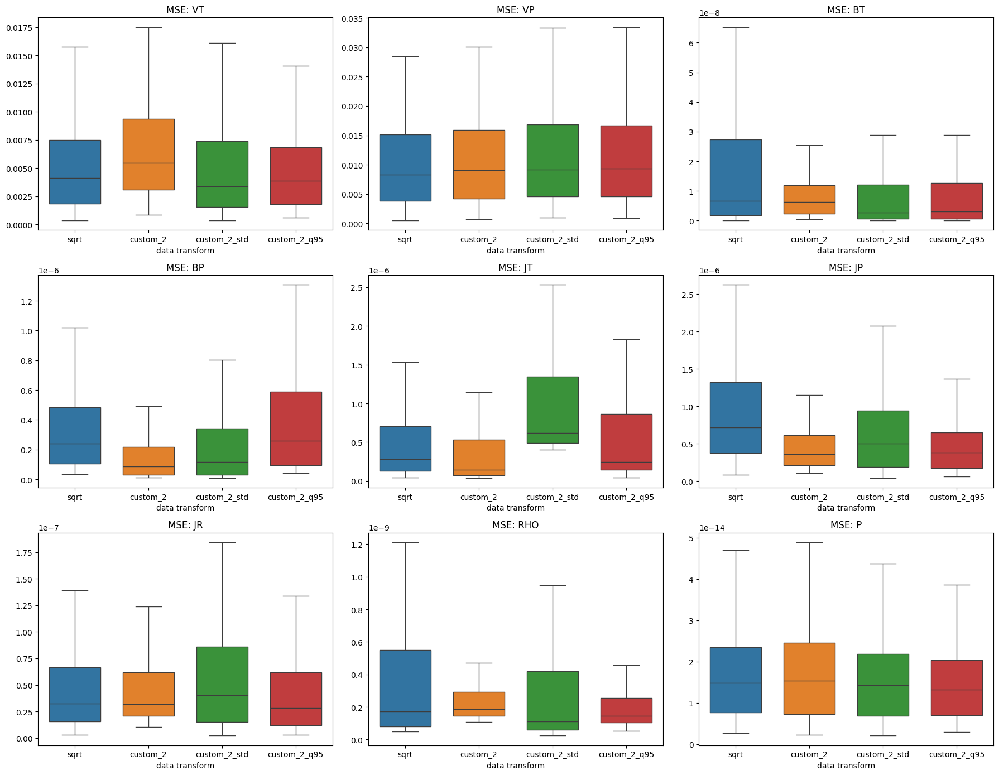

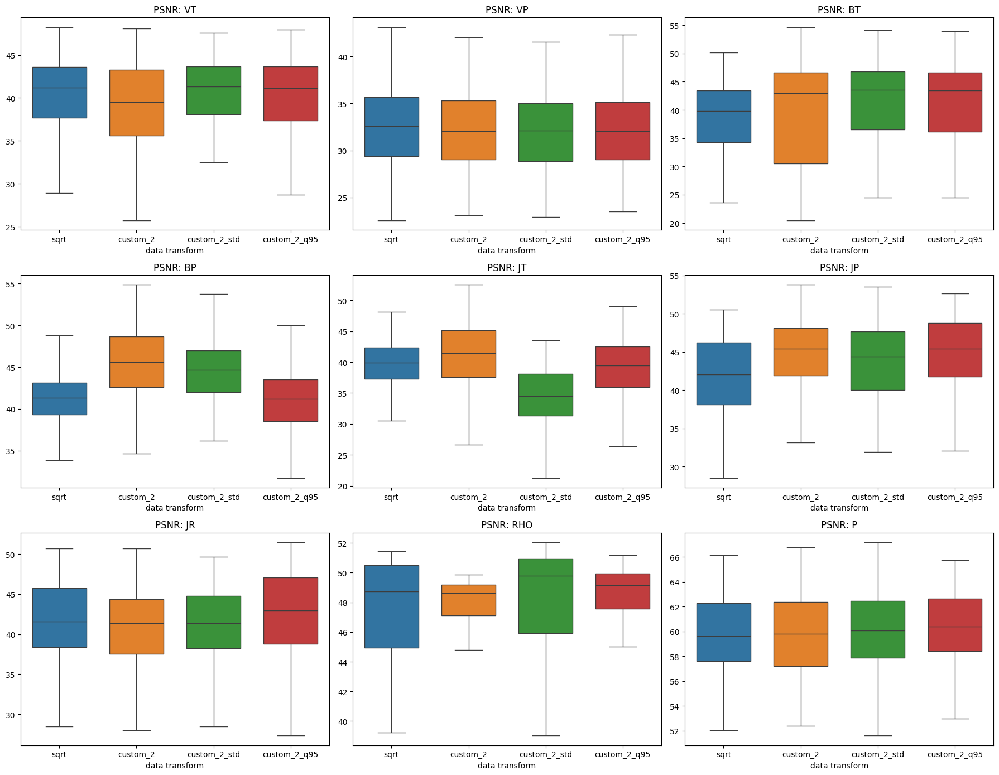

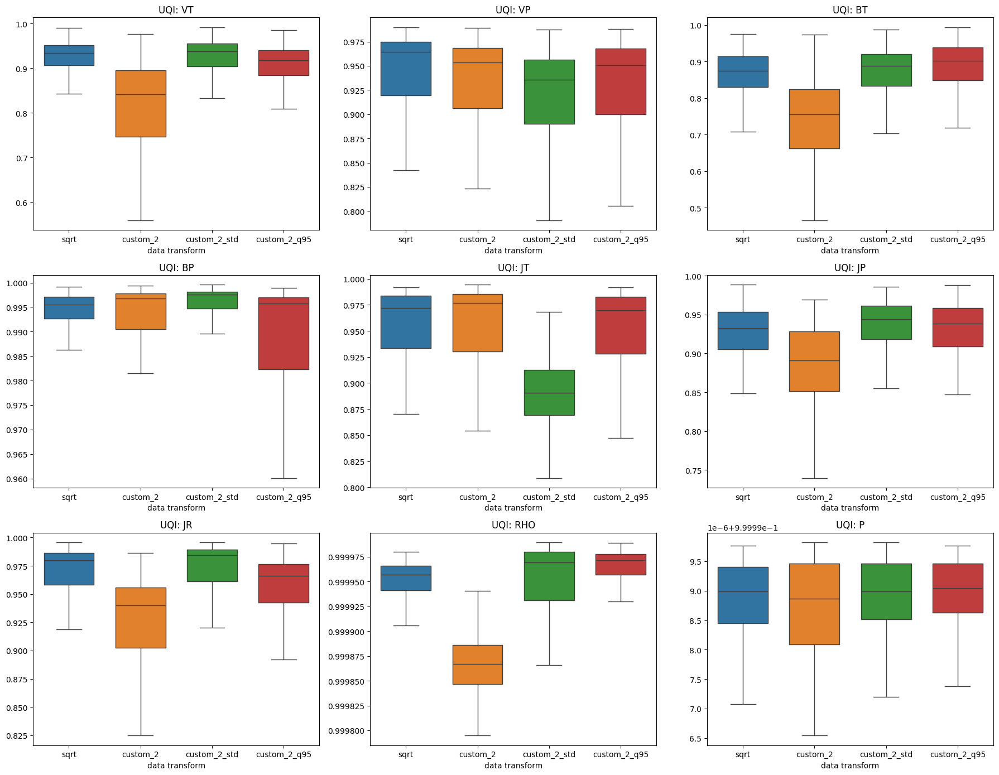

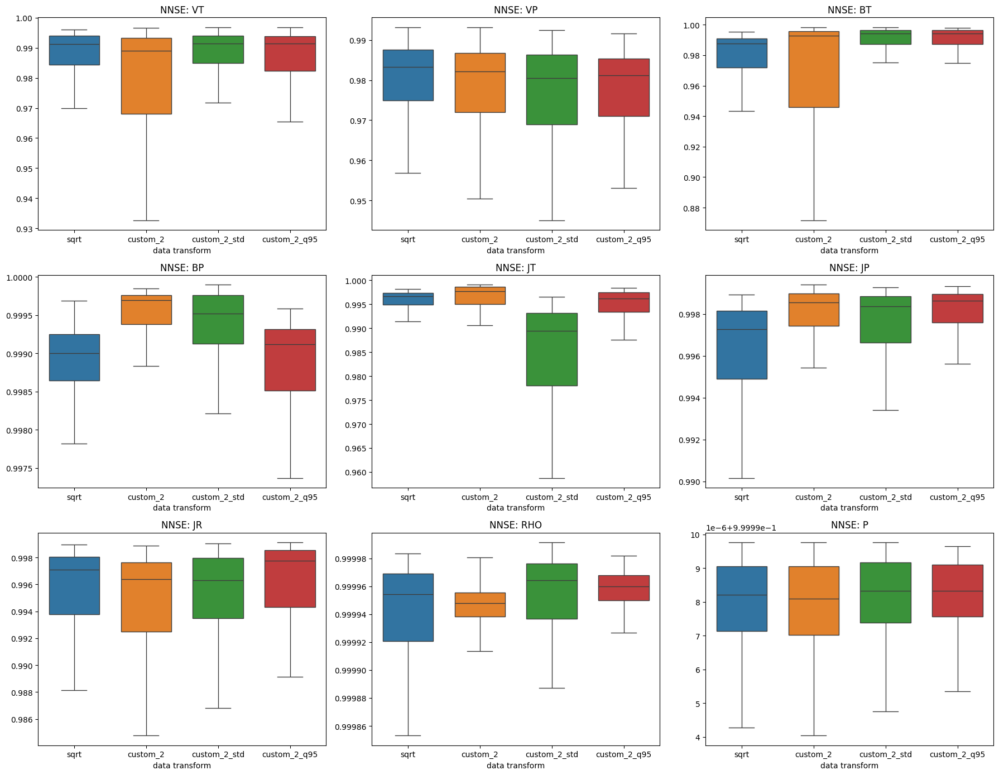

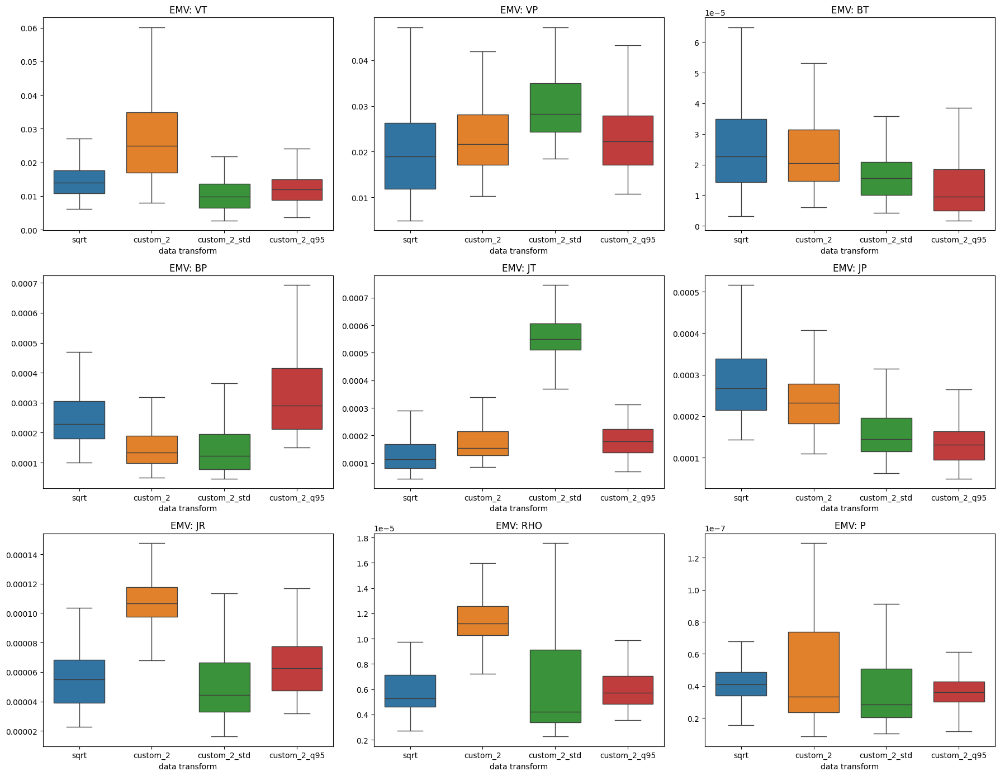

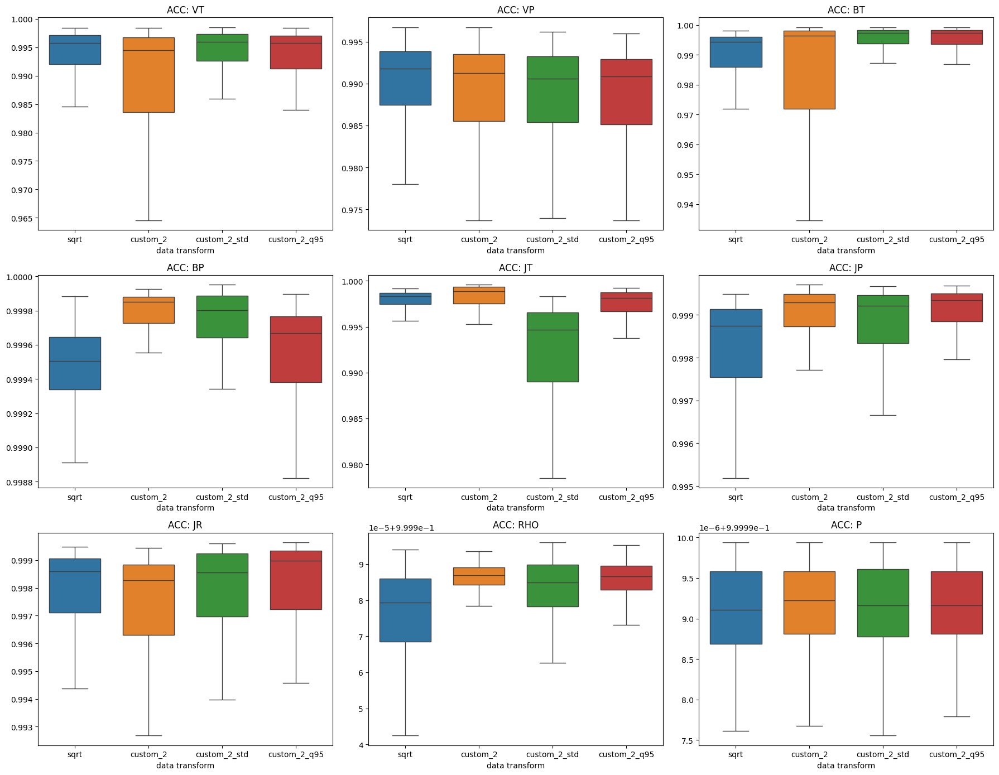

In [125]:
for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
    metric_df = result_transform_df[result_transform_df["metric"] == metric].copy()

    fig, axes = plt.subplots(3, 3, figsize=(18, 14), sharey=False)
    axes = axes.flatten()

    for i, comp in enumerate(component_list):
        sns.boxplot(
            data=metric_df,
            x="transform",
            y=comp,
            hue="transform",
            ax=axes[i],
            showfliers=False,
            # palette=palette,
            width=0.7
        )

        axes[i].set_title(f"{metric}: {comp.upper()}")
        axes[i].set_xlabel(r"data transform")
        axes[i].set_ylabel("")
        axes[i].tick_params(axis="x", rotation=0)

        # Keep only one legend for the whole figure
        if axes[i].get_legend() is not None:
            axes[i].get_legend().remove()

    plt.tight_layout()

    plt.savefig(
        os.path.join("/app/docs/resources/exp_4/transform", f"transform_{metric}_boxplot.png"),
        dpi=200,
        bbox_inches="tight"
    )
    plt.savefig(
        os.path.join("/app/docs/resources/exp_4/transform", f"transform_{metric}_boxplot.pdf"),
        dpi=200,
        bbox_inches="tight"
    )

    plt.show()

### Violin Plot

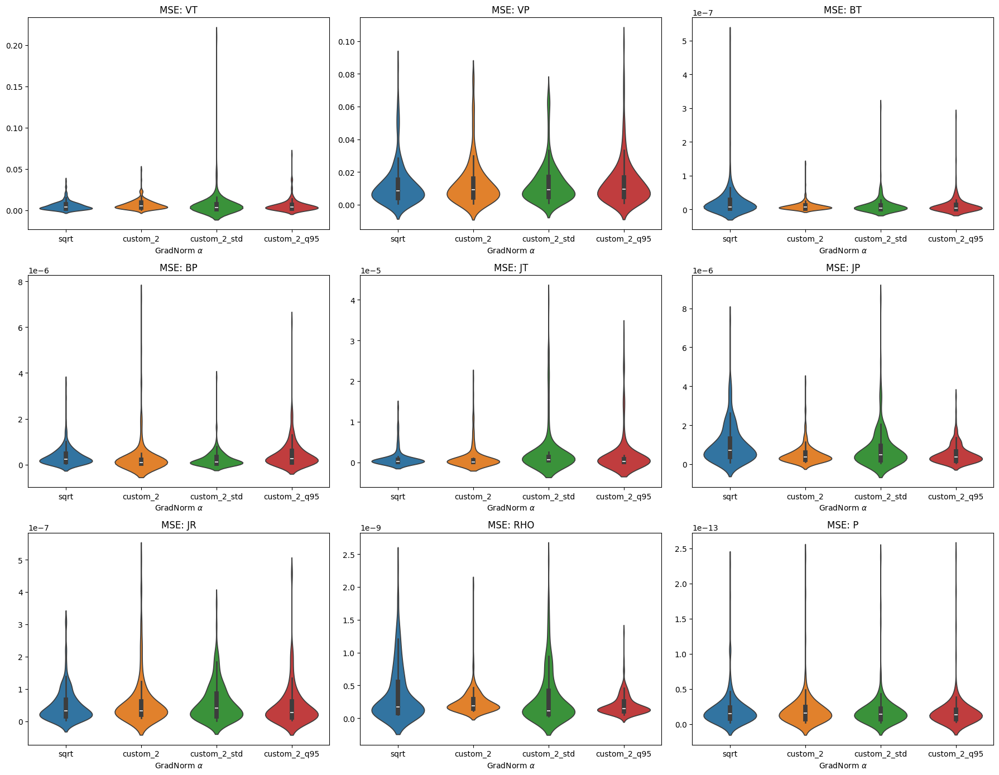

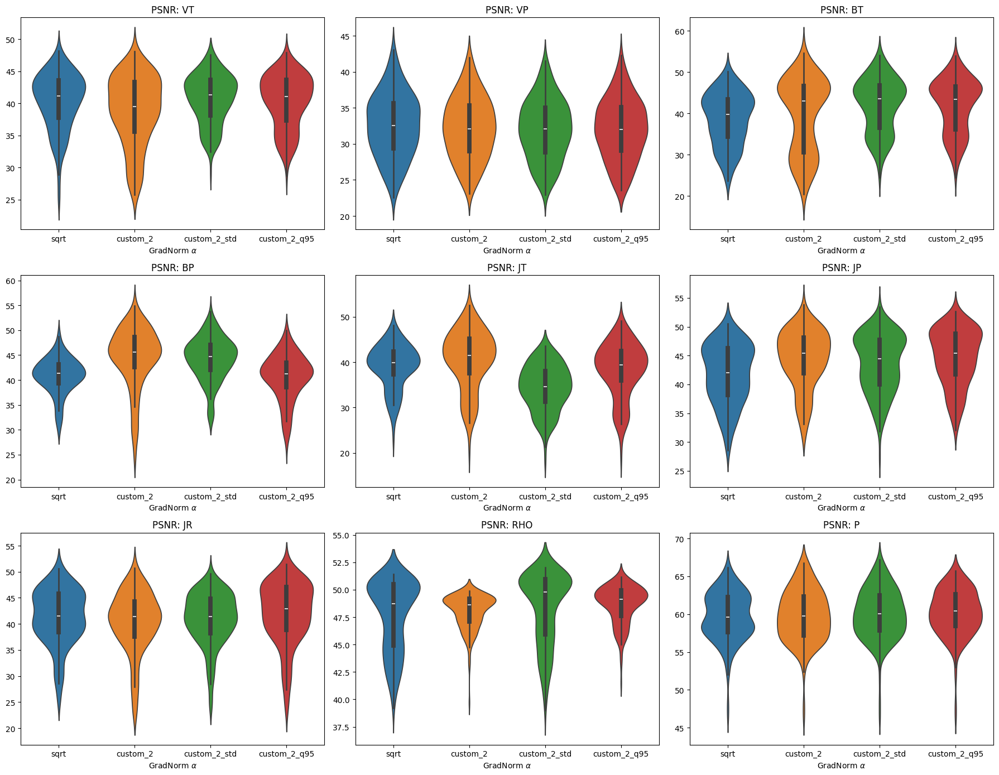

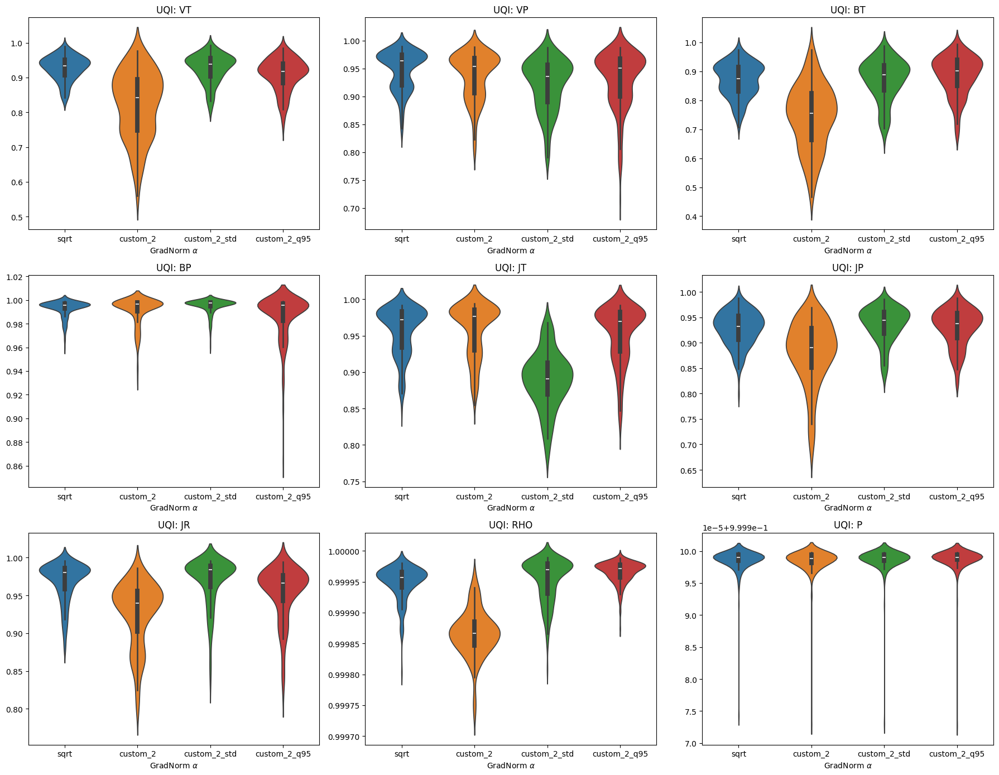

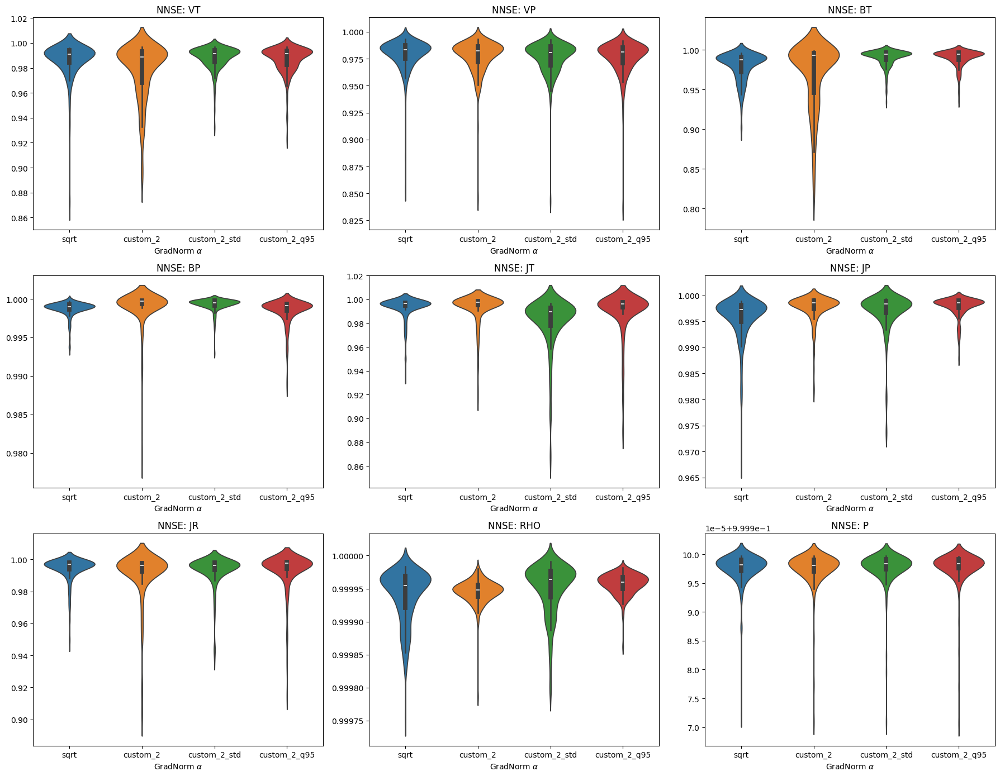

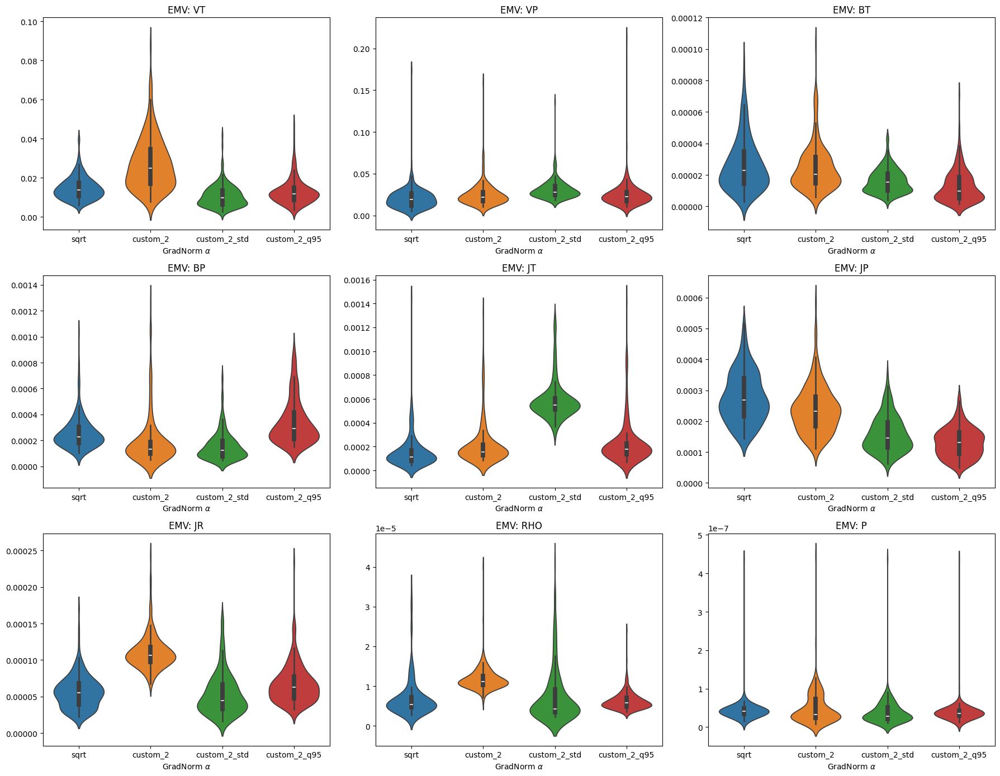

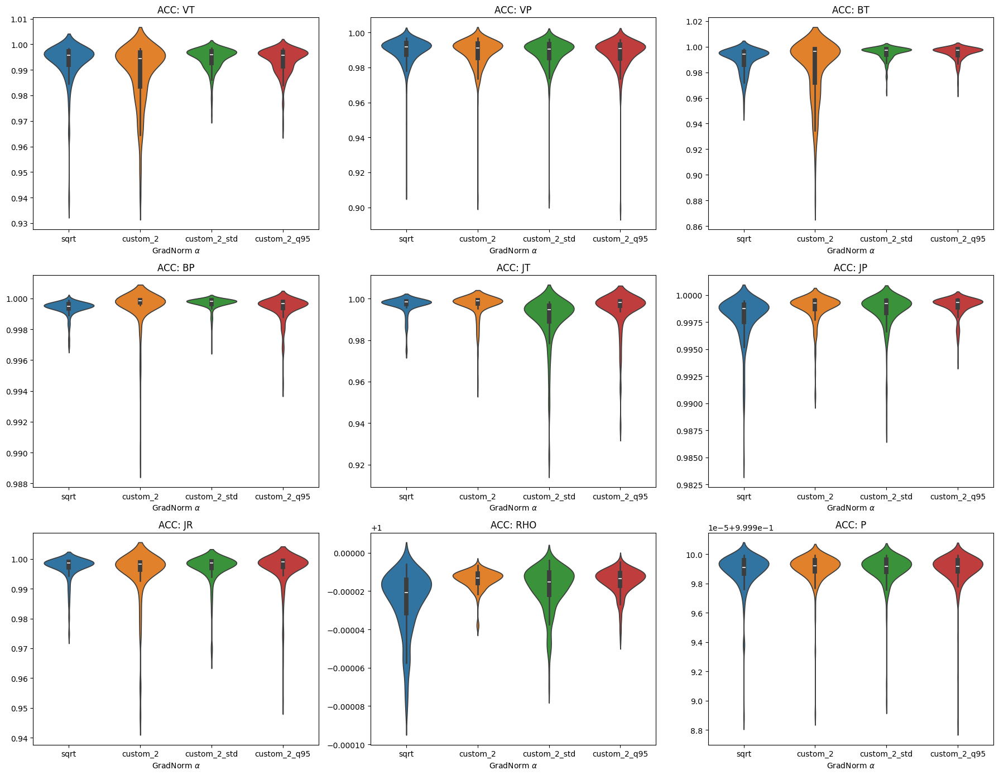

In [124]:
# Optional: make lr labels cleaner for legend
# result_alpha_df["lr_label"] = result_alpha_df["lr"].map({
#     1e-3: r"$10^{-3}$",
#     1e-4: r"$10^{-4}$"
# })
# palette = {
#     r"$10^{-3}$": "#4C72B0",
#     r"$10^{-4}$": "#DD8452",
# }

for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
    metric_df = result_transform_df[result_transform_df["metric"] == metric].copy()

    fig, axes = plt.subplots(3, 3, figsize=(18, 14), sharey=False)
    axes = axes.flatten()

    for i, comp in enumerate(component_list):
        sns.violinplot(
            data=metric_df,
            x="transform",
            y=comp,
            hue="transform",
            ax=axes[i],
            # showfliers=False,
            # palette=palette,
            width=0.7
        )

        axes[i].set_title(f"{metric}: {comp.upper()}")
        axes[i].set_xlabel(r"GradNorm $\alpha$")
        axes[i].set_ylabel("")
        axes[i].tick_params(axis="x", rotation=0)

        # Keep only one legend for the whole figure
        if axes[i].get_legend() is not None:
            axes[i].get_legend().remove()

    plt.tight_layout()

    plt.savefig(
        os.path.join("/app/docs/resources/exp_4/transform", f"transform_{metric}.png"),
        dpi=200,
        bbox_inches="tight"
    )
    plt.savefig(
        os.path.join("/app/docs/resources/exp_4/transform", f"transform_{metric}.pdf"),
        dpi=200,
        bbox_inches="tight"
    )

    plt.show()

# Gradnorm on Physical units

In [3]:
job_id_descriptors = {
    # '2026_05_18__020744': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5, 'transform': 'sqrt'},
    '2026_06_03__062026': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5, 'transform': 'custom_2_std', 'units': 'normalized'},
    '2026_06_03__062346': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5, 'transform': 'custom_2_q95', 'units': 'normalized'},
    '2026_06_06__074810': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5, 'transform': 'custom_2_std', 'units': 'physical'},
    '2026_06_06__080553': {'rank': 0.4, 'gradnorm': 'True','lr': 1e-4, 'alpha':1.5, 'transform': 'custom_2_q95', 'units': 'physical'},
    
}

for job in job_id_descriptors.keys():
    if job_id_descriptors[job]['gradnorm'] == 'False':
        f = np.load(os.path.join(BASE_DIR, job,'test_best_epoch_per_sample_per_component.npz'))
    else:
        f = np.load(os.path.join('/data/solar_wind_pred_vignesh/ParamNetwork', job,'test_best_epoch_per_sample_per_component.npz'))
    for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
        job_id_descriptors[job][metric] = f[metric]

result_rows = []

for run_name, run_data in job_id_descriptors.items():
    for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
        metric_values = run_data[metric]
        row_dict = {}
        for idx, val in enumerate(metric_values):
            row_dict = {component_list[comp]: v for comp, v in enumerate(val)}
            for k, v in run_data.items():
                row_dict[k] = run_data[k]
            row_dict['job'] = run_name
            row_dict['metric'] = metric
            
            result_rows.append(row_dict)

result_transform_df = pd.DataFrame(result_rows)
print(result_transform_df.shape)

(4392, 23)


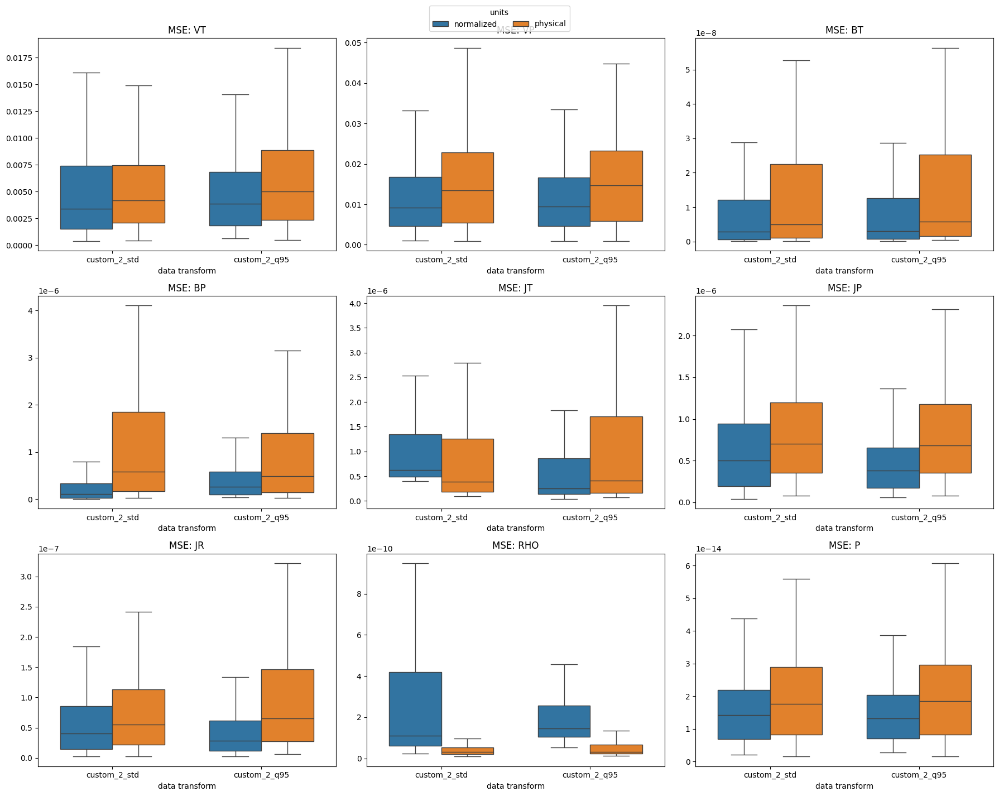

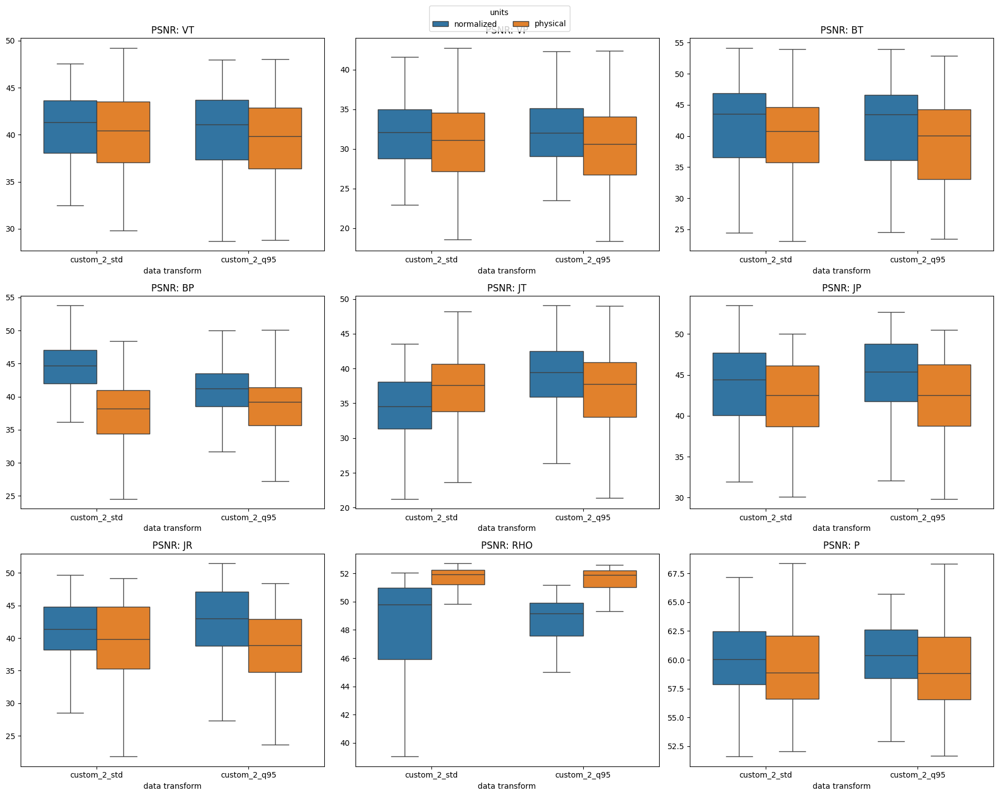

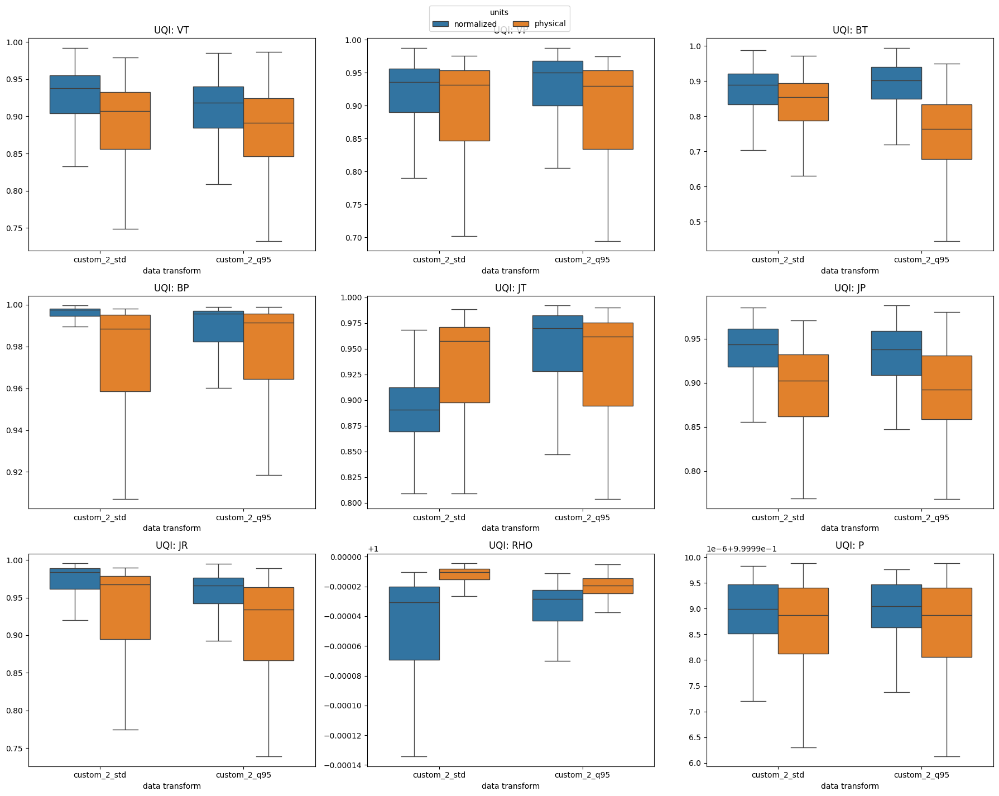

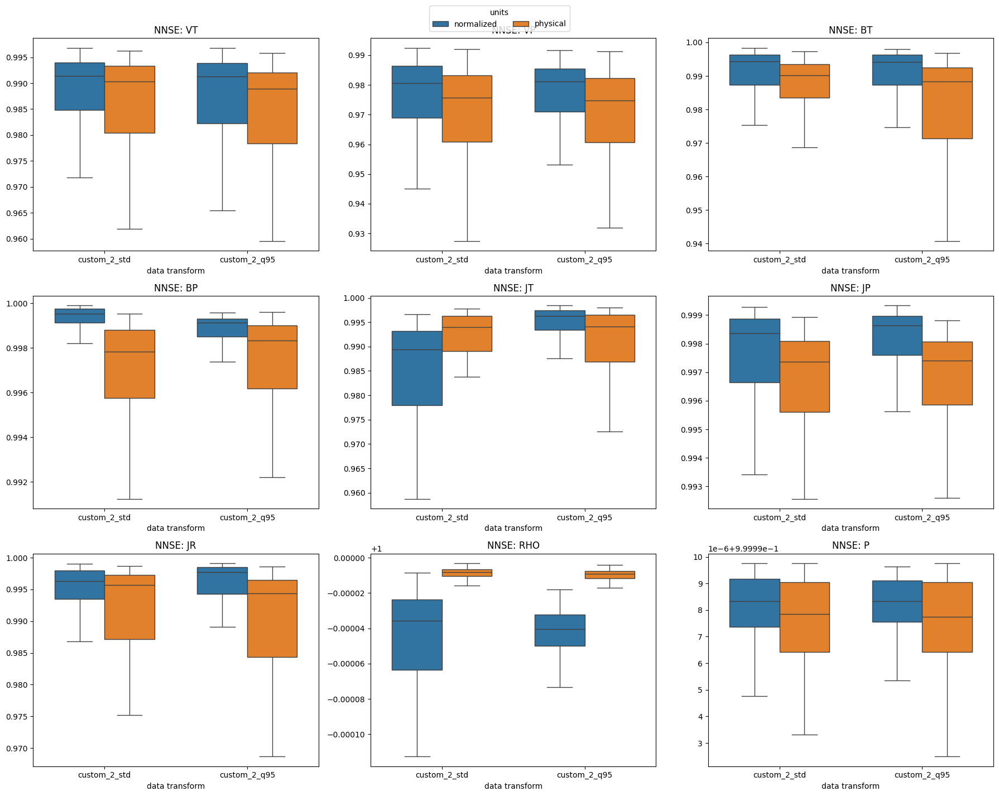

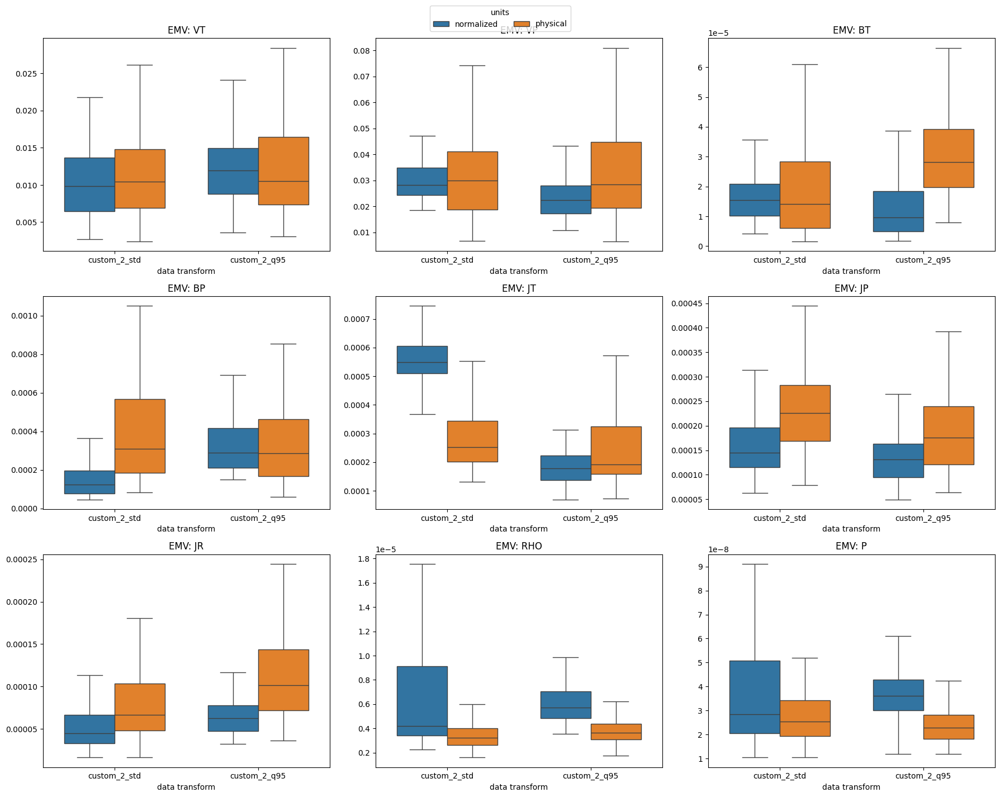

In [ ]:
import os
import matplotlib.pyplot as plt
import seaborn as sns

save_dir = "/app/docs/resources/exp_5/transform"
os.makedirs(save_dir, exist_ok=True)

# Optional: enforce order
unit_order = ["normalized", "physical"]

for metric in PER_SAMPLE_PER_COMPONENT_METRICS:
    metric_df = result_transform_df[
        result_transform_df["metric"] == metric
    ].copy()

    fig, axes = plt.subplots(3, 3, figsize=(18, 14), sharey=False)
    axes = axes.flatten()

    for i, comp in enumerate(component_list):
        sns.boxplot(
            data=metric_df,
            x="transform",          # groups: custom_2_std, custom_2_q95, etc.
            y=comp,
            hue="units",            # columns inside each group: normalized, physical
            hue_order=unit_order,
            ax=axes[i],
            showfliers=False,
            width=0.7
        )

        axes[i].set_title(f"{metric}: {comp.upper()}")
        axes[i].set_xlabel(r"data transform")
        axes[i].set_ylabel("")
        axes[i].tick_params(axis="x", rotation=0)

        # Remove individual subplot legends
        if axes[i].get_legend() is not None:
            axes[i].get_legend().remove()

    # Shared legend for full figure
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles,
        labels,
        title="units",
        loc="upper center",
        ncol=len(labels),
        bbox_to_anchor=(0.5, 1.02)
    )

    plt.tight_layout()

    plt.savefig(
        os.path.join(save_dir, f"transform_{metric}_grouped_units_boxplot.png"),
        dpi=200,
        bbox_inches="tight"
    )

    plt.savefig(
        os.path.join(save_dir, f"transform_{metric}_grouped_units_boxplot.pdf"),
        dpi=200,
        bbox_inches="tight"
    )

    plt.show()